<a href="https://colab.research.google.com/github/Deesplore/Classification/blob/main/Bike_Sharing_Demand_Prediction_Regression_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - 



##### **Project Type**    -  Bike Sharing Demand Prediction Regression project
##### **Contribution**    - Individual
##### **Team Member 1 -** - Prabhakar Subhash Harijan

# **Project Summary -**

Bikes are rented more when there is considerably low rainfall at 1.3mm, bike counted was 764 can say very low rainfall and when there is no  rainfall  count on that is 739.
low count is around 12mm to 16mm between 11 to 13 . 
 Bikes are mostly renetd at 32* which is bascially a normal temeprature and has the highest no. around 1692, while the lowest at -15 around 25.  
Highest number of bikes were rented during Summer seasons it was 1034 we can say that because many schools and colleges have there summer vacation leave, while least number of bikes were rented during Winter seasons. It was 225 and almost evenly in spring and autumn ranging from 730 to 8194.  
Large no. of bikes are rented when there are non holiday it was 715 and very less no. is for holiday which was 499. Bikes are only rented only on functional day with the count of 729. Bikes rented on saturday was more it was around 719 while it was low on sundays around 667. Maximum no. of bike rented is in the evening at 6 pm which was 1502 and the least was in the morining at 4 am around 132. Bike should be more available in the evening as compared to morning. Customers have rented bikes more on friday following as considering weekends the count for friday was around 747 and it was some what same in the wednesday and monday to around 740 and 730 but the least no. of bike rented was on the Sunday 625.we can see that our bikes rented count went on increasing for the month is january from 201. It was in the peek in the month of june  which was 1245 and then it saw a sudden downfall around 249 counts in december.  

Bikes should be more avaliable while there is less rainfall, bike should be more available in the range of 15* to  32* which is normal temperature so bikes should be more avaliable at that temperature ranges. Bikes should be available more on non holidays as compared to those on holiday. People prefer bikes more in the months of summer and almost equally in the spring and autumn and least in  winter,.. so bikes should be more available in summer season and accordingly in the following season. Bikes should be available almost on functional day and being on the safer end few counts for non functional day, bikes are mostly evenly rented ranging form 600 to 750 which is decent count so accordinly bike should be availabe everyday and count should be around 800 .. as better option, no. of supply of bike should me more in the month of june and gradually follows.

Best performing model came out to be GradientBoostRegressor after doing the gridsearch. so we used it to final prediction.
Important feature came out be hour, so bike should be available more duirng peak hours, which is in the evening.


# **GitHub Link -**

https://github.com/Deesplore/Regression

# **Problem Statement**


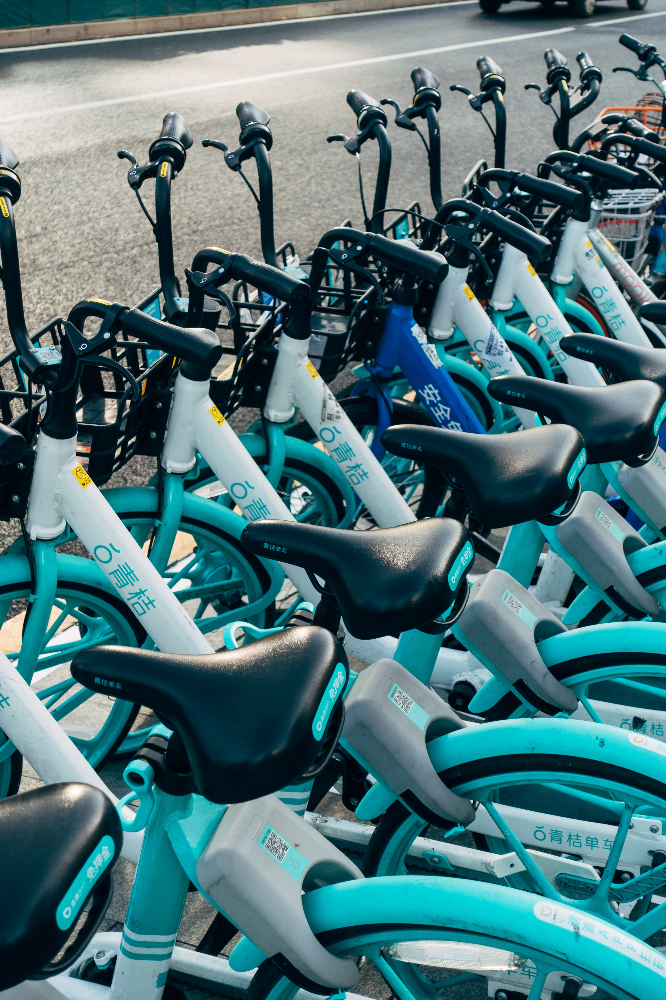  


**Currently Rental bikes are introduced in many urban cities for the enhancement of mobility comfort. It is important to make the rental bike available and accessible to the public at the right time as it lessens the waiting time. Eventually, providing the city with a stable supply of rental bikes becomes a major concern. The crucial part is the prediction of bike count required at each hour for the stable supply of rental bikes..**

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required. 
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits. 
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule. 

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [ ]:

# Importing required modules and loading dataset
import numpy as np
import pandas as pd
from datetime import datetime as dt
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
import matplotlib
import matplotlib.pyplot as plt
import missingno as msno
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from matplotlib.patheffects import PathPatchEffect, SimpleLineShadow, Normal
import matplotlib.patheffects as path_effects
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.tree import export_graphviz
from sklearn.linear_model import SGDRegressor
from yellowbrick.regressor import ResidualsPlot
from yellowbrick.regressor import PredictionError
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
import warnings
warnings.filterwarnings('ignore')
!pip install shap==0.40.0
import shap 
shap.initjs()
import graphviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


### Dataset Loading

In [ ]:
# Load Dataset
from google.colab import drive
drive.mount('/content/drive')
dataset=pd.read_csv("/content/drive/MyDrive/SeoulBikeData.csv",encoding = 'unicode_escape')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Dataset First View

In [ ]:
# Dataset First Look
dataset.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
dataset.shape

(8760, 14)

We have 8760 rows and 14 columns

### Dataset Information

In [ ]:
# Dataset Info
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

There are no missing values in our dataset

#### Duplicate Values

In [ ]:
# Dataset Duplicate Value Count
len(dataset[dataset.duplicated()])

0

No duplicate values are found in our dataset

#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count
dataset.isnull().sum()

Date                         0
Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
dtype: int64

<Axes: >

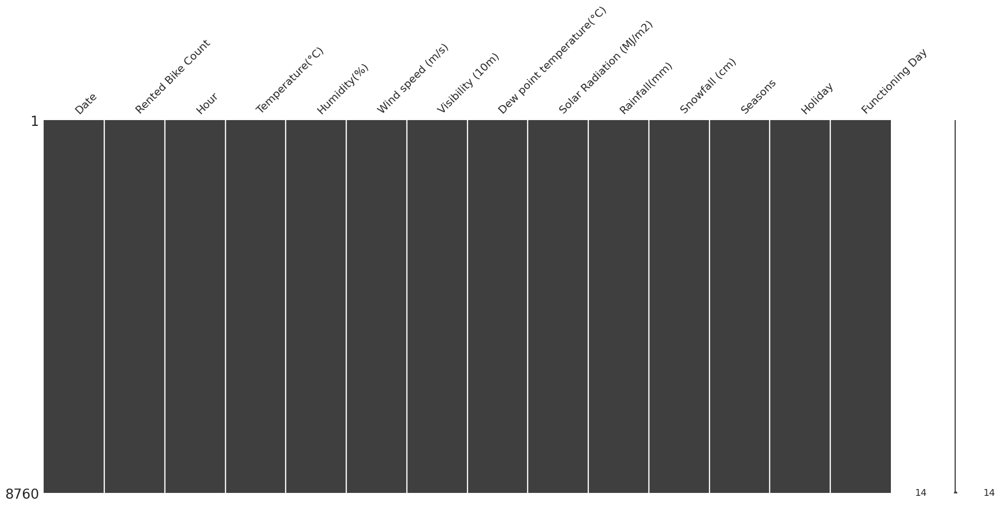

In [ ]:
# Visualizing the missing values
msno.matrix(dataset)

### What did you know about your dataset?

The dataset contains weather information (Temperature, Humidity, Windspeed, Visibility, Dewpoint, Solar radiation, Snowfall, Rainfall), the number of bikes rented per hour and date information.  We need to make the model in such a way that the supply of bikes are suficient for the customers..

## ***2. Understanding Your Variables***

In [ ]:
# Dataset Columns
dataset.columns

Index(['Date', 'Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday', 'Functioning Day'],
      dtype='object')

In [ ]:
# Dataset Describe
dataset.describe(include='all')

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
count,8760,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760,8760,8760
unique,365,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,2,2
top,01/12/2017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Spring,No Holiday,Yes
freq,24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2208,8328,8465
mean,NaN,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068,NaN,NaN,NaN
std,NaN,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746,NaN,NaN,NaN
min,NaN,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000,NaN,NaN,NaN
25%,NaN,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000,NaN,NaN,NaN
50%,NaN,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000,NaN,NaN,NaN
75%,NaN,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000,NaN,NaN,NaN


### Variables Description 

Attribute Information:  
**Date** : Timestamp Year-month-day  
                       **Rented Bike count** - Count of bikes rented at each hour   
                       **Hour** - Hour of the day  
                       **Temperature**-Temperature in Celsius  
                       **Humidity** - % Windspeed - m/s Visibility - 10m  
                       **Dew point temperature** - Celsius   
                       **Solar radiation** - Solar radiation in (MJ/m2)   
                       **Rainfall** -   Rainfall in (mm)   
                       **Snowfall** -  Snowfall in (cm)   
                       **Seasons** - Winter, Spring, Summer, Autumn   
                       **Holiday** -   Holiday/No holiday   
                       **Functioning Day** - Weekdays except official holidays


### Check Unique Values for each variable.

In [ ]:
# Check Unique Values for each variable.
dataset.nunique()

Date                          365
Rented Bike Count            2166
Hour                           24
Temperature(°C)               546
Humidity(%)                    90
Wind speed (m/s)               65
Visibility (10m)             1789
Dew point temperature(°C)     556
Solar Radiation (MJ/m2)       345
Rainfall(mm)                   61
Snowfall (cm)                  51
Seasons                         4
Holiday                         2
Functioning Day                 2
dtype: int64

No. of unique values in  Date is 365 .
No. of unique values in  Rented Bike Count is 2166 .
No. of unique values in  Hour is 24 .
No. of unique values in  Temperature(°C) is 546 .
No. of unique values in  Humidity(%) is 90 .
No. of unique values in  Wind speed (m/s) is 65 .
No. of unique values in  Visibility (10m) is 1789 .
No. of unique values in  Dew point temperature(°C) is 556 .
No. of unique values in  Solar Radiation (MJ/m2) is 345 .
No. of unique values in  Rainfall(mm) is 61 .
No. of unique values in  Snowfall (cm) is 51 .
No. of unique values in  Seasons is 4 .
No. of unique values in  Holiday is 2 .
No. of unique values in  Functioning Day is 2 .


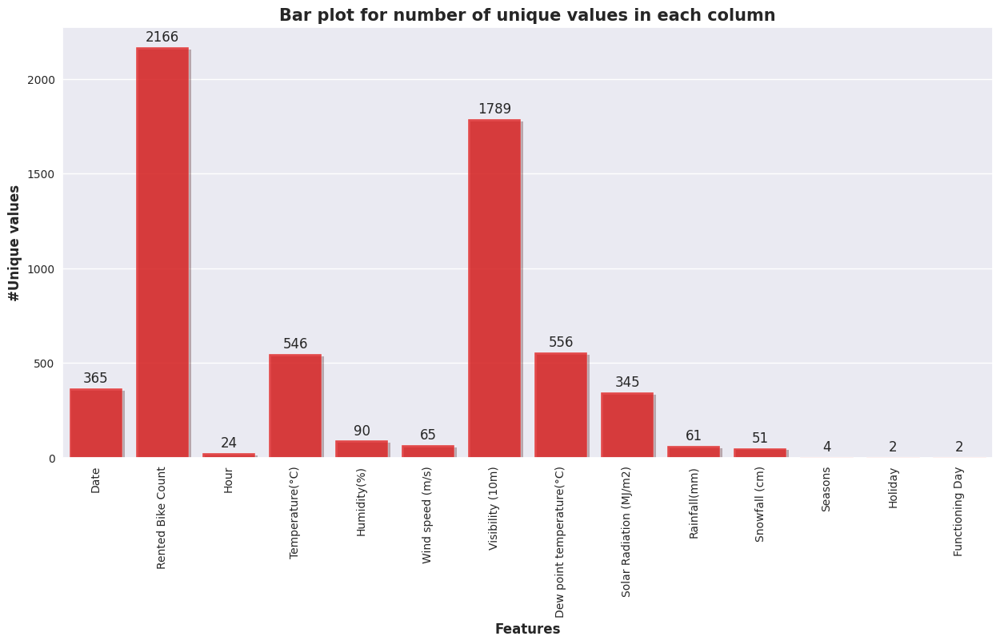

In [ ]:
for i in dataset.columns.tolist():
  print("No. of unique values in ",i,"is",dataset[i].nunique(),".")

unique_dataset = pd.DataFrame()
unique_dataset['Features'] = dataset.columns
unique=[]
for i in dataset.columns:
    unique.append(dataset[i].nunique())
unique_dataset['Uniques'] = unique

f, ax = plt.subplots(1,1, figsize=(15,7))

splot = sns.barplot(x=unique_dataset['Features'], y=unique_dataset['Uniques'], alpha=0.8,path_effects=[path_effects.SimplePatchShadow(),path_effects.Normal()],color = 'red')
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center',
                   va = 'center', xytext = (0, 9), textcoords = 'offset points')
plt.title('Bar plot for number of unique values in each column',weight='bold', size=15)
plt.ylabel('#Unique values', size=12, weight='bold')
plt.xlabel('Features', size=12, weight='bold')
plt.xticks(rotation=90)
plt.show()

## 3. ***Data Wrangling***

### Data Wrangling Code

In [ ]:
# Write your code to make your dataset analysis ready.
# Using Lambda function to strip date from string to Datetime format so to retrieve d,m,y
dataset['Date'] = dataset['Date'].apply(lambda x:dt.strptime(x, "%d/%m/%Y"))
dataset['Day'] = dataset['Date'].dt.day_name()
dataset['Month'] = dataset['Date'].dt.month
dataset['Year'] = dataset['Date'].dt.year

In [ ]:
#  Adding  a new column named Weekend with binary values, indicating 1 for weekend and 0 for a weekday.. 
dataset['weekend']=dataset['Day'].apply(lambda z: 1 if z=='Sunday' or  z=='Saturday' else 0)

In [ ]:
dataset=dataset.drop(columns=['Date'],axis=1)
dataset=dataset.drop(columns=['Year'],axis=1)

In [ ]:
dataset1=dataset.copy()

In [ ]:
dataset.sample(5)

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,Day,Month,weekend
773,58,5,-3.1,67,0.6,1384,-8.3,0.00,0.0,0.0,Winter,No Holiday,Yes,Tuesday,1,0
8362,779,10,9.6,53,1.4,1818,0.4,1.16,0.0,0.0,Autumn,No Holiday,Yes,Wednesday,11,0
1274,75,2,-7.5,65,3.9,2000,-12.9,0.00,0.0,1.0,Winter,No Holiday,Yes,Tuesday,1,0
7930,898,10,9.5,46,3.7,1871,-1.5,1.49,0.0,0.0,Autumn,No Holiday,Yes,Saturday,10,1
3204,1095,12,18.2,15,1.6,2000,-8.9,2.27,0.0,0.0,Spring,No Holiday,Yes,Friday,4,0


### What all manipulations have you done and insights you found?

1. We first stripted our date columm is three parts for better understanding
2. We added binary values and added a weekend column
3. We drop date column after striping it.
4. We Dropped year column as it was not necesaary.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1

In [ ]:
# Chart - 1 visualization code
dataset.groupby('Month')['Rented Bike Count'].mean().sort_values(ascending=False)

Month
6     1245.676389
7      987.177419
5      950.387097
9      935.572222
8      876.192204
10     874.563172
4      728.093056
11     646.826389
3      511.551075
12     249.099462
2      225.941964
1      201.620968
Name: Rented Bike Count, dtype: float64

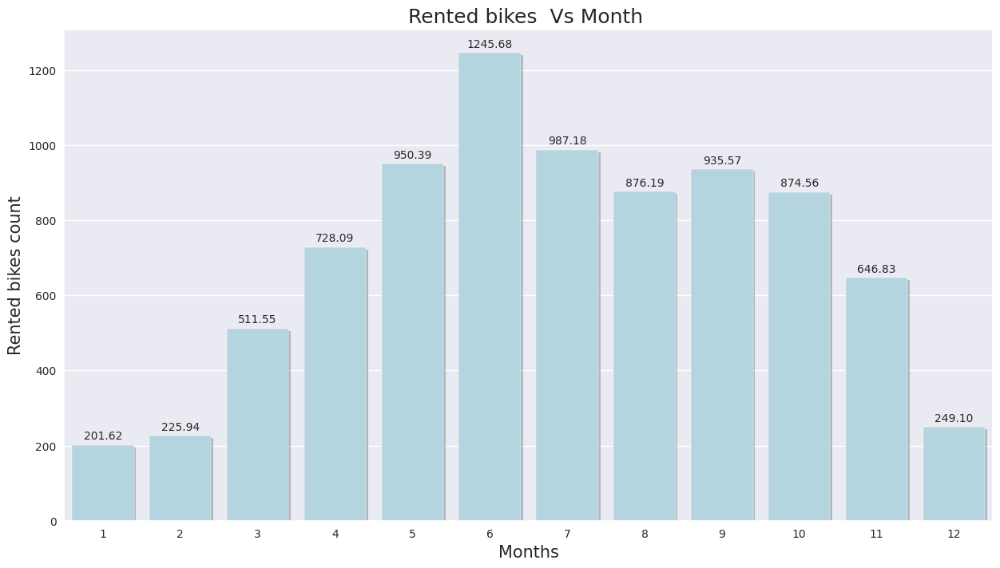

In [ ]:
# Chart - 1 visualization code
# Visualisation of number of rented bikes vs Months:
fig,ax=plt.subplots(figsize=(15,8))
sns.barplot(data=dataset,x='Month',y='Rented Bike Count',path_effects=[path_effects.SimplePatchShadow(),path_effects.Normal()],color = 'lightblue' , ci=None)
ax.set_title('Rented bikes  Vs Month ' , fontsize=18)
ax.set_xlabel('Months',fontsize=15)
ax.set_ylabel('Rented bikes count',fontsize=15)
for bar in ax.patches:
    ax.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=10, xytext=(0, 8),
                   textcoords='offset points')

Text(0.5, 1.0, 'Rented bikes  Vs Month')

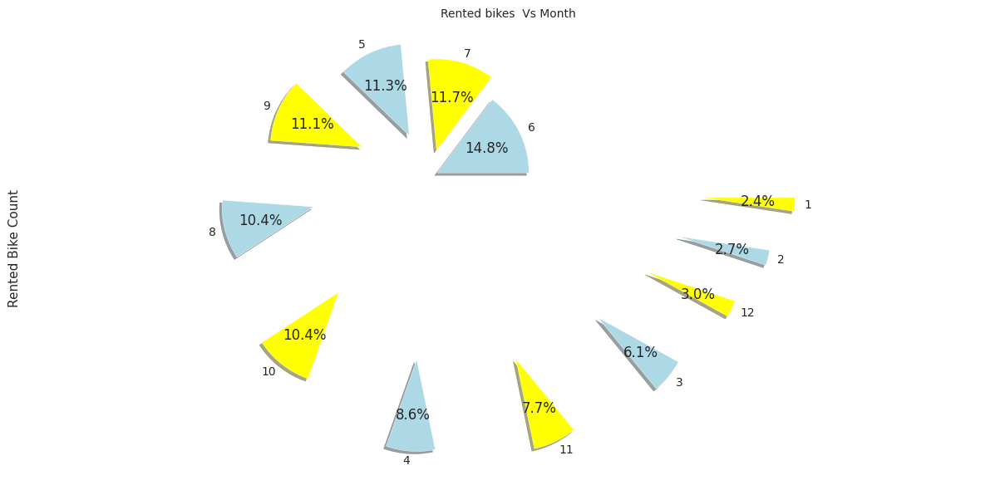

In [ ]:
dataset.groupby('Month')['Rented Bike Count'].mean().sort_values(ascending=False).plot(kind='pie',shadow=True,autopct='%1.1f%%',colors = ( "#ADD8E6", "yellow"),figsize=(15,7),startangle=360,explode=[0.1,0.3,0.5,0.8,1.3,1.6,2,2.2,2.4,2.6,2.8,3])
plt.axis('equal')
plt.title('Rented bikes  Vs Month',fontsize = 10)

##### 1. Why did you pick the specific chart?

The bar graph is used to compare the items between different groups over time. Bar graphs are used to measure the changes over a period of time. When the changes are larger, a bar graph is the best option to represent the data. Thus i used it to find the relation between our bike rented w.r.t to months
and i have use pie chart also just to visliuaize the detail more

##### 2. What is/are the insight(s) found from the chart?

we can see that our bikes rented count went on increasing for the month is january from 201. it was in the peek in the month of june which was 1245 and then it saw a sudden downfall around 249 counts in december.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

After analyzing our above graph we can see that no. of supply of bike should me more in the month of june and gradually follows.

#### Chart - 2

In [ ]:
# Chart - 2 visualization code
dataset.groupby('Day')['Rented Bike Count'].mean().sort_values(ascending=False)

Day
Friday       747.117925
Wednesday    740.349359
Monday       730.563301
Saturday     709.528846
Thursday     690.704327
Tuesday      687.977564
Sunday       625.155449
Name: Rented Bike Count, dtype: float64

Text(0, 0.5, 'Rented Bikes per day')

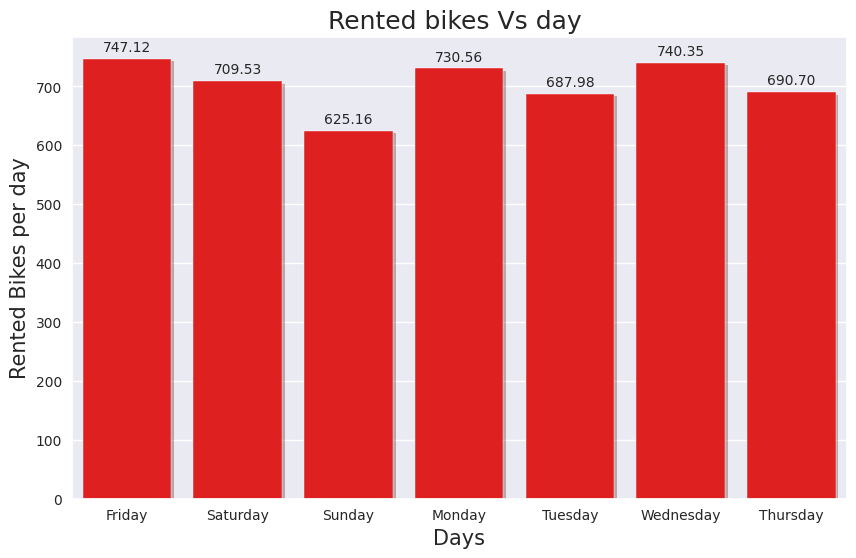

In [ ]:
# Visualisation of average number of rented bikes vs day:
 
fig,ax=plt.subplots(figsize=(10,6))
sns.barplot(data=dataset,x='Day',y='Rented Bike Count',path_effects=[path_effects.SimplePatchShadow(),path_effects.Normal()],ax=ax,ci=None , color ='Red')
ax.set_title('Rented bikes Vs day ' , fontsize=18)
ax.set_xlabel('Days',fontsize=15)
for bar in ax.patches:
    ax.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=10, xytext=(0, 8),
                   textcoords='offset points')
ax.set_ylabel('Rented Bikes per day',fontsize=15)

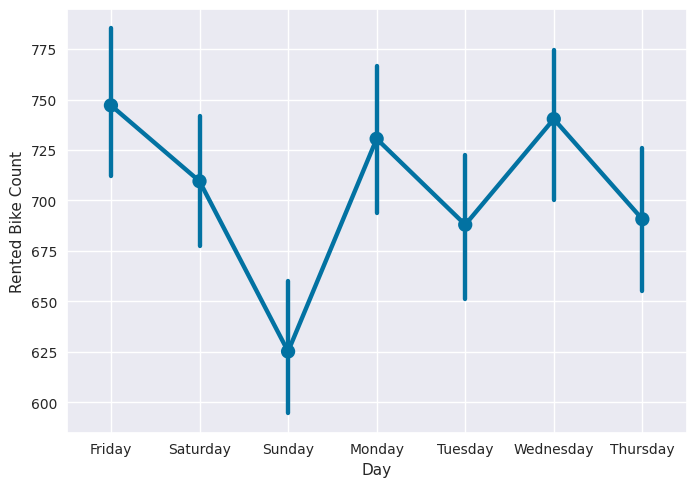

In [ ]:
sns.pointplot(data=dataset,x='Day',y='Rented Bike Count',dodge=True)
plt.grid(True)   

##### 1. Why did you pick the specific chart?

The bar graph is used to compare the items between different groups over time. Bar graphs are used to measure the changes over a period of time. When the changes are larger, a bar graph is the best option to represent the data.
Thus i used this graph to know how much bike is rented each day, And we have used pointplot to just to analyze our relation more clearly.

##### 2. What is/are the insight(s) found from the chart?

Customers have rented bikes more on friday following as considering weekends the count for friday was around 747 and it was some what same in the wednesday and monday to around 740 and 730 but the least no. of bike rented was on the Sunday 625..

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Analyzing the above graph concludes that bikes are mostly evenly rented ranging form 600 to 750 which is desent count so accordinly bike should be availabe everyday and count should be around 800 .. as better option.

#### Chart - 3

In [ ]:
# Chart - 3 visualization code
dataset.groupby('Hour')['Rented Bike Count'].mean().sort_values(ascending=False)

Hour
18    1502.926027
19    1195.147945
17    1138.509589
20    1068.964384
21    1031.449315
8     1015.701370
16     930.621918
22     922.797260
15     829.186301
14     758.824658
13     733.246575
12     699.441096
23     671.126027
9      645.983562
7      606.005479
11     600.852055
0      541.460274
10     527.821918
1      426.183562
2      301.630137
6      287.564384
3      203.331507
5      139.082192
4      132.591781
Name: Rented Bike Count, dtype: float64

Text(0, 0.5, 'Rented Bikes')

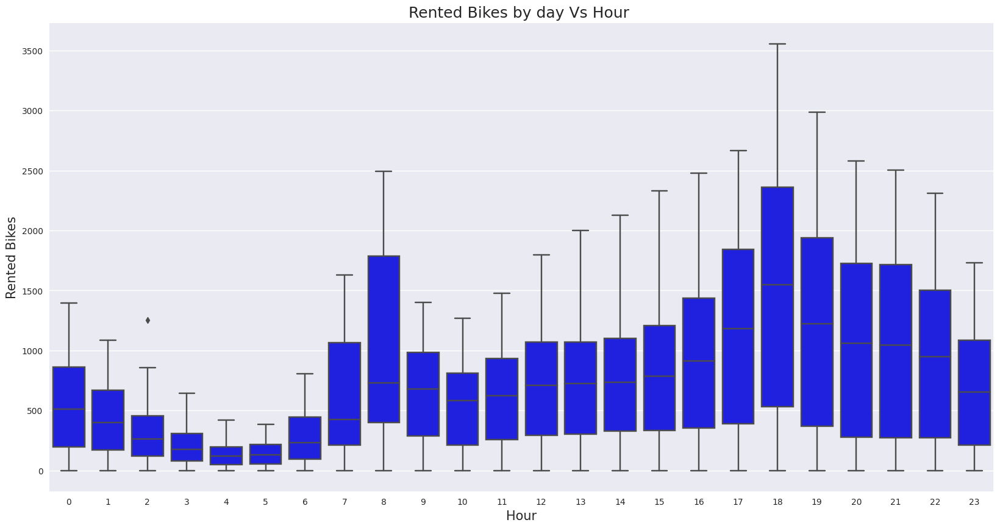

In [ ]:
# Visualisation of Rented bikes vs Hour of the Day:
fig,ax=plt.subplots(figsize=(20,10))
sns.boxplot(data=dataset,x='Hour',y='Rented Bike Count', color ='blue')
ax.set_title('Rented Bikes by day Vs Hour ', fontsize=18)
ax.set_xlabel('Hour',fontsize=15)
ax.set_ylabel('Rented Bikes',fontsize=15)

Text(0, 0.5, 'Rented Bikes per hour')

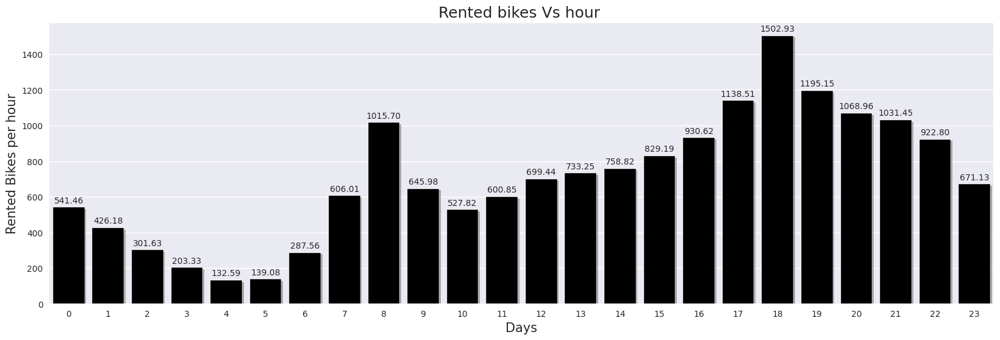

In [ ]:
fig,ax=plt.subplots(figsize=(20,6))
sns.barplot(data=dataset,x='Hour',y='Rented Bike Count',path_effects=[path_effects.SimplePatchShadow(),path_effects.Normal()],ax=ax,ci=None , color ='black')
ax.set_title('Rented bikes Vs hour ' , fontsize=18)
ax.set_xlabel('Days',fontsize=15)
for bar in ax.patches:
    ax.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=10, xytext=(0, 8),
                   textcoords='offset points')
ax.set_ylabel('Rented Bikes per hour',fontsize=15)

##### 1. Why did you pick the specific chart?

Box plots are used to show distributions of numeric data values, especially when you want to compare them between multiple groups. They are built to provide high-level information at a glance, offering general information about a group of data's symmetry, skew, variance, and outliers.
Thus i used to find the tendency of bike rented by hour w.r.t to day,
Barplot is used to get clear insights of the data.

##### 2. What is/are the insight(s) found from the chart?

Maximum no. of bike rented is in the evening at 6 pm which was 1502 and the least was in the morining at 4 am around 132. The above graph shows that bike should be more available in the evening as compared to morning.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Bikes should be more availbale in the evening and evenely distributed from the morning and afternoon too.. 

#### Chart - 4

In [ ]:
# Chart - 4 visualization code
dataset.groupby('weekend')['Rented Bike Count'].mean().sort_values(ascending=False)

weekend
0    719.448914
1    667.342147
Name: Rented Bike Count, dtype: float64

Text(0, 0.5, 'Rented Bikes')

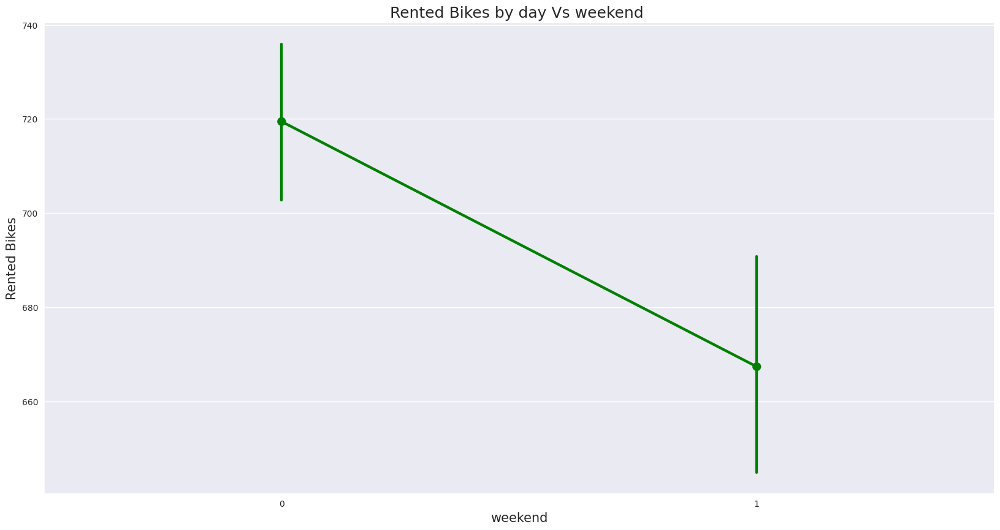

In [ ]:
# Visualisation of Rented bikes vs Hour of the Day:
fig,ax=plt.subplots(figsize=(20,10))
sns.pointplot(data=dataset,x='weekend',y='Rented Bike Count',  color ='green')
ax.set_title('Rented Bikes by day Vs weekend ', fontsize=18)
ax.set_xlabel('weekend',fontsize=15)
ax.set_ylabel('Rented Bikes',fontsize=15)

Text(0.5, 1.0, 'Rented Bikes by day Vs weekend ')

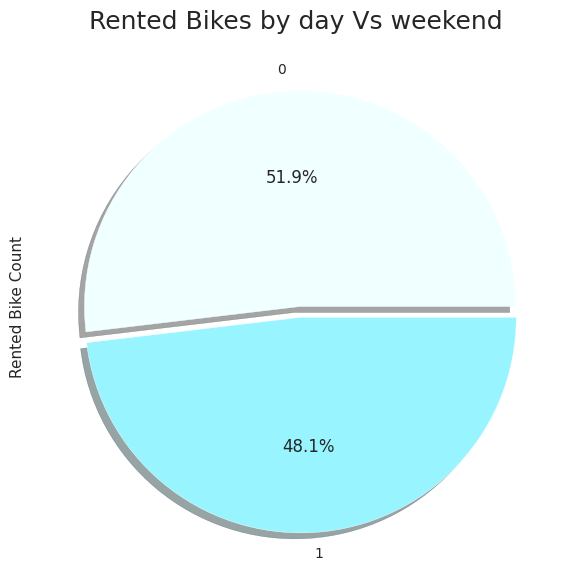

In [ ]:
dataset.groupby('weekend')['Rented Bike Count'].mean().sort_values(ascending=False).plot(kind='pie',shadow=True,autopct='%1.1f%%',colors = ('#F0FFFF','#98F5FF'),figsize=(15,7),explode=[0,0.05])
plt.title('Rented Bikes by day Vs weekend ', fontsize=18)

##### 1. Why did you pick the specific chart?


I have used pie chart to the percentage count.
A point plot uses scatter plot glyphs to visualize features like point estimates and confidence intervals. A point plot uses scatter plot points to represent the central tendency of numeric data.These plots make use of error bars to indicate any uncertainty around the numeric variables
Thus i used it to find the tendency of bike rented by hour on weekend.

##### 2. What is/are the insight(s) found from the chart?

Bikes rented on saturday was more it was around 719 while it was low on sundays 
around 667.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

We can say people rented bikes more on saturday while less on sundays so the availabiality of the bikes should be more on saturday.

#### Chart - 5

In [ ]:
# Chart - 5 visualization code
dataset.groupby('Functioning Day')['Rented Bike Count'].mean().sort_values(ascending=False)

Functioning Day
Yes    729.156999
No       0.000000
Name: Rented Bike Count, dtype: float64

Text(0, 0.5, 'Rented Bikes')

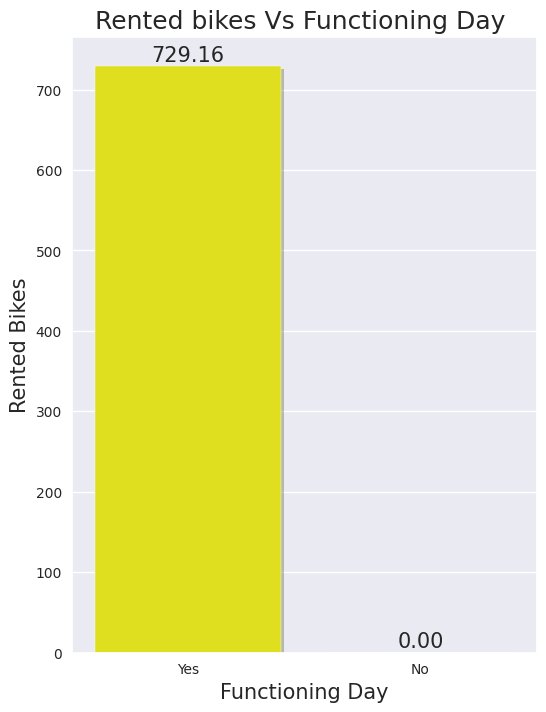

In [ ]:
# Analysis of rented Bikes Vs Functioning Day:

fig,ax=plt.subplots(figsize=(6,8))
sns.barplot(data=dataset,x='Functioning Day',y='Rented Bike Count',path_effects=[path_effects.SimplePatchShadow(),path_effects.Normal()], ci=None,color = 'yellow' )
for bar in ax.patches:
    ax.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=15, xytext=(0, 8),
                   textcoords='offset points')
ax.set_title('Rented bikes Vs Functioning Day ', fontsize=18)
ax.set_xlabel('Functioning Day',fontsize=15)
ax.set_ylabel('Rented Bikes',fontsize=15)

##### 1. Why did you pick the specific chart?

The bar graph is used to compare the items between different groups over time. Bar graphs are used to measure the changes over a period of time. When the changes are larger, a bar graph is the best option to represent the data.
Thus i used this graph to get a clear look of bike rented on functional day

##### 2. What is/are the insight(s) found from the chart?

Bikes are only rented only on functional day. with the count of 729

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Bikes should be available almost on functional day and being on the safer end few counts for non functional day.

#### Chart - 6

In [ ]:
# Chart - 6 visualization code

Text(0, 0.5, 'Rented Bikes')

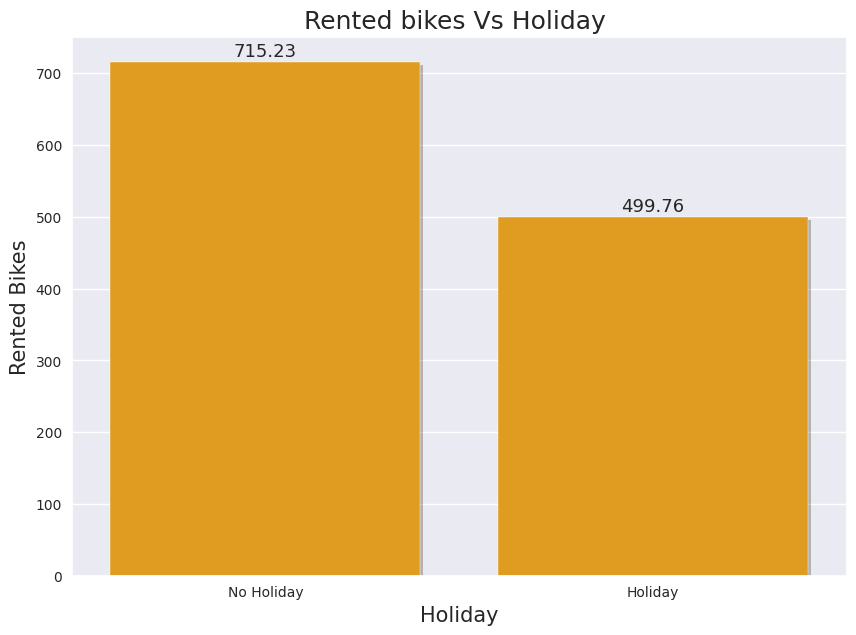

In [ ]:
# Analysis of Rented Bikes Vs Holiday or not:

fig,ax=plt.subplots(figsize=(10,7))
sns.barplot(data=dataset,x='Holiday',y='Rented Bike Count',path_effects=[path_effects.SimplePatchShadow(),path_effects.Normal()] ,color ='orange', ci= None)
for bar in ax.patches:
    ax.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=13, xytext=(0, 8),
                   textcoords='offset points')
ax.set_title('Rented bikes Vs Holiday ' , fontsize=18)
ax.set_xlabel('Holiday',fontsize=15);
ax.set_ylabel('Rented Bikes',fontsize=15)

##### 1. Why did you pick the specific chart?

The bar graph is used to compare the items between different groups over time. Bar graphs are used to measure the changes over a period of time. When the changes are larger, a bar graph is the best option to represent the data.
Thus i used this graph to get a clear look of bike rented on holidays

##### 2. What is/are the insight(s) found from the chart?

Large no. of bikes are rented when there are non holiday it was 715 and very less no. is for holiday which was 499.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

BIkes should be available more on non holidays as compared to those on holiday..

#### Chart - 7

In [ ]:
# Chart - 7 visualization code
k=pd.DataFrame(dataset.groupby('Seasons')['Rented Bike Count'].mean().sort_values(ascending=False))
k.head()

,Rented Bike Count
Seasons,
Summer,1034.073370
Autumn,819.597985
Spring,730.031250
Winter,225.541204


Text(0, 0.5, 'Rented Bikes')

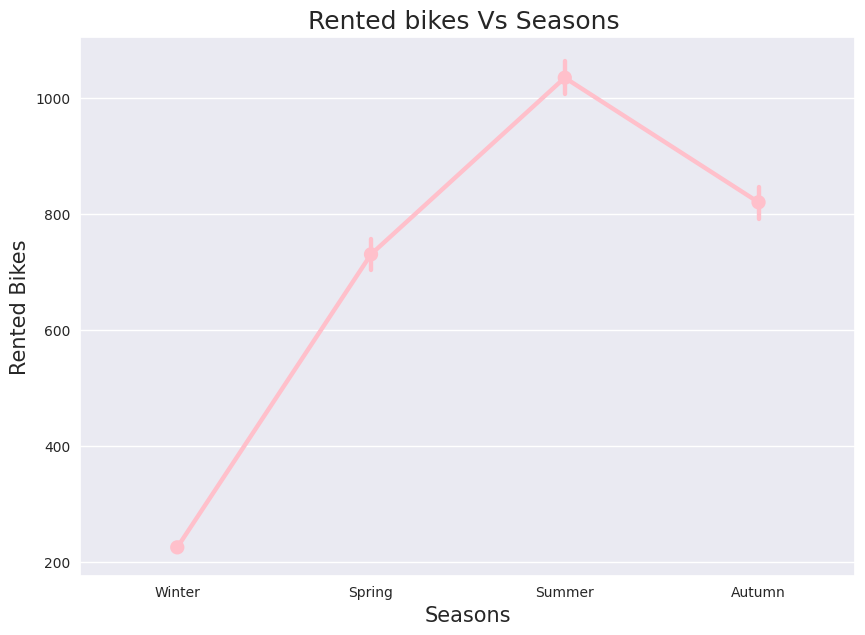

In [ ]:
# Analysis of Rented Bikes Vs Seasons:
fig,ax=plt.subplots(figsize=(10,7))
sns.pointplot(data=dataset,x='Seasons',y='Rented Bike Count', color ='pink' )
ax.set_title('Rented bikes Vs Seasons ' , fontsize=18)
ax.set_xlabel('Seasons',fontsize=15)
ax.set_ylabel('Rented Bikes',fontsize=15)

Text(0.5, 1.0, 'Rented bikes Vs Seasons')

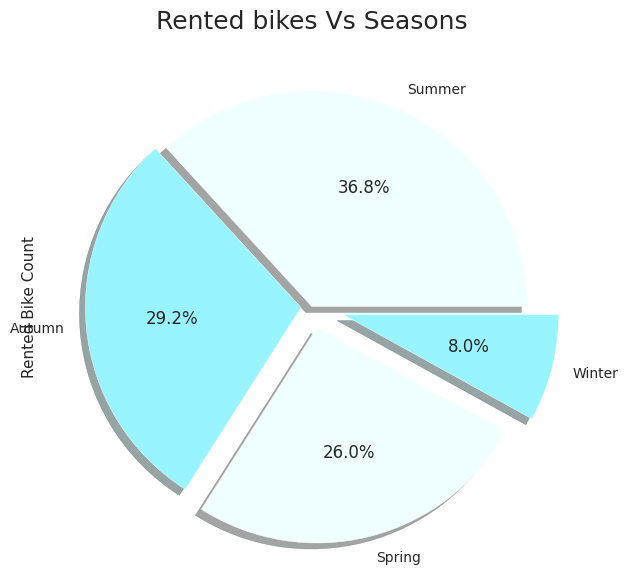

In [ ]:
dataset.groupby('Seasons')['Rented Bike Count'].mean().sort_values(ascending=False).plot(kind='pie',shadow=True,autopct='%1.1f%%',colors = ('#F0FFFF','#98F5FF'),figsize=(15,7),explode=[0,0.05,0.1,0.15])
plt.title('Rented bikes Vs Seasons', fontsize=18)

##### 1. Why did you pick the specific chart?

A point plot uses scatter plot glyphs to visualize features like point estimates and confidence intervals. A point plot uses scatter plot points to represent the central tendency of numeric data.These plots make use of error bars to indicate any uncertainty around the numeric variables
Thus i used it to find the tendency of bike rented accoring to seasons,I have use pie chart also to know the percentage count of the data also.

##### 2. What is/are the insight(s) found from the chart?

we can see that Highest number of bikes were rented during *Summer seasons* it was 1034 while least number of bikes were rented during *Winter seasons*. it was 225 and almost evenly in spring and autumn
ranging from 730 to 819

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

People prefer bikes more in the months of summer and almost equally in the spring and autumn and least in  winter,.. so bikes should be more available in summer season and accordingly in the following season.

#### Chart - 8

In [ ]:
# Chart - 8 visualization code
k=pd.DataFrame(dataset.groupby('Temperature(°C)')['Rented Bike Count'].mean().sort_values(ascending=False))
k.head(5)

,Rented Bike Count
Temperature(°C),
32.2,1692.875000
32.5,1638.000000
30.3,1579.750000
35.2,1558.333333
26.6,1552.650000


In [ ]:
k.tail(5)

,Rented Bike Count
Temperature(°C),
-15.3,63.833333
-15.6,60.333333
-16.0,46.000000
-16.9,36.000000
-15.4,24.500000


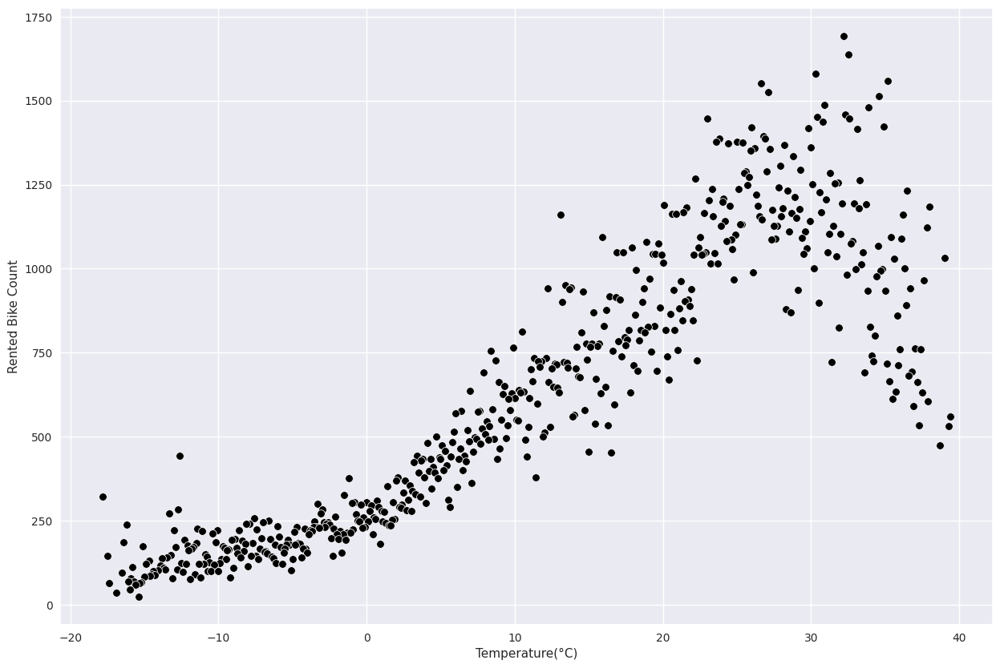

In [ ]:
avg_bike=k.groupby('Temperature(°C)')['Rented Bike Count'].mean()

plt.figure(figsize=(15,10))
plt.title('Rented bikes Vs Temperature', fontsize=18)
plt.xlabel('Temperature(°C)')
plt.ylabel('Rented Bike Count')
sns.scatterplot(data=k,x='Temperature(°C)',y='Rented Bike Count', color ='black', )
plt.show()

##### 1. Why did you pick the specific chart?

Scatter plots’ primary uses are to observe and show relationships between two numeric variables. The dots in a scatter plot not only report the values of individual data points, but also patterns when the data are taken as a whole.
so by using the graph we can see the tendency of temperature how much it is affecting our renetd bike count 

##### 2. What is/are the insight(s) found from the chart?

Bikes are mostly renetd at 32* which is bascially a normal temeprature and has the highest no.. around 1692.. while the lowest at -15 around 25

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Yes graph tell us that bike should be more available in the range of 15* to  32* which is normal temperature so bikes should be more avaliable at that temperature ranges.

#### Chart - 9

In [ ]:
# Chart - 9 visualization code
avg_bike=pd.DataFrame(dataset.groupby('Rainfall(mm)')['Rented Bike Count'].mean().sort_values(ascending=False))
avg_bike.head(5)

,Rented Bike Count
Rainfall(mm),
1.3,764.000000
0.0,739.311103
21.5,596.000000
0.9,489.333333
7.3,468.000000


In [ ]:
avg_bike.tail(5)

,Rented Bike Count
Rainfall(mm),
12.0,13.0
16.0,11.0
18.0,10.5
15.5,10.0
7.5,9.0


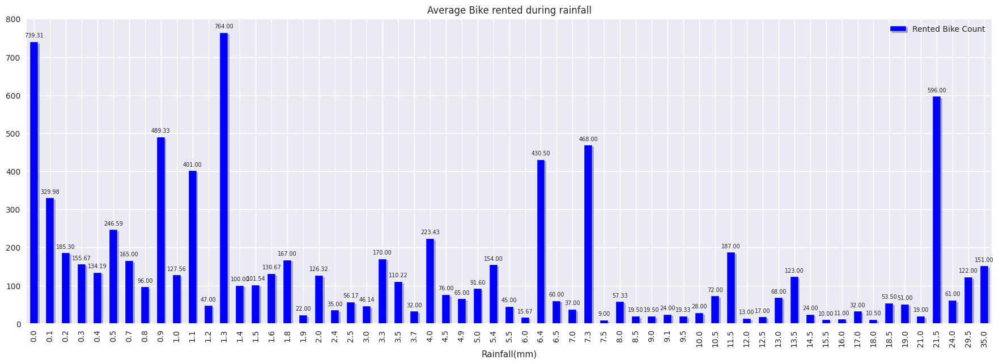

In [ ]:
# Visualisation of Average Bike rented during rainfall:

avg_bike=dataset.groupby('Rainfall(mm)')['Rented Bike Count'].mean()
plt.figure(figsize=(22,7))
ax=avg_bike.plot(legend=True,title=f'Average Bike rented during rainfall',color='blue',kind='bar',path_effects=[path_effects.SimplePatchShadow(),path_effects.Normal()])
for bar in ax.patches:
    ax.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=7, xytext=(0, 8),
                   textcoords='offset points')
ax.set_xticks(range(len(avg_bike)))
ax.set_xticklabels(avg_bike.index.tolist(),rotation = 90)
plt.show()

##### 1. Why did you pick the specific chart?

The bar graph is used to compare the items between different groups over time. Bar graphs are used to measure the changes over a period of time. When the changes are larger, a bar graph is the best option to represent the data.
Thus i used this graph to get a clear look of bike rented during rainfall

##### 2. What is/are the insight(s) found from the chart?

Bikes are rented more when there is considerably low rainfall at 1.3mm bike counted was 764 can say very low rainfall and when there is no  rainfall  count on that is 739.
low count is around 12mm to 16mm between 11 to 13 

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Bikes should be more avaliable while there is less rainfall.

#### Chart - 10 - Correlation Heatmap

In [ ]:
# Correlation Heatmap visualization code
corr = dataset.corr()
corr.style.background_gradient(cmap='ocean_r')

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Month,weekend
Rented Bike Count,1.000000,0.410257,0.538558,-0.199780,0.121108,0.199280,0.379788,0.261837,-0.123074,-0.141804,0.133514,-0.036467
Hour,0.410257,1.000000,0.124114,-0.241644,0.285197,0.098753,0.003054,0.145131,0.008715,-0.021516,0.000000,-0.000000
Temperature(°C),0.538558,0.124114,1.000000,0.159371,-0.036252,0.034794,0.912798,0.353505,0.050282,-0.218405,0.216183,0.007214
Humidity(%),-0.199780,-0.241644,0.159371,1.000000,-0.336683,-0.543090,0.536894,-0.461919,0.236397,0.108183,0.139875,-0.016951
Wind speed (m/s),0.121108,0.285197,-0.036252,-0.336683,1.000000,0.171507,-0.176486,0.332274,-0.019674,-0.003554,-0.156710,-0.022227
Visibility (10m),0.199280,0.098753,0.034794,-0.543090,0.171507,1.000000,-0.176630,0.149738,-0.167629,-0.121695,0.064874,-0.026762
Dew point temperature(°C),0.379788,0.003054,0.912798,0.536894,-0.176486,-0.176630,1.000000,0.094381,0.125597,-0.150887,0.242552,-0.006990
Solar Radiation (MJ/m2),0.261837,0.145131,0.353505,-0.461919,0.332274,0.149738,0.094381,1.000000,-0.074290,-0.072301,-0.031595,0.012975
Rainfall(mm),-0.123074,0.008715,0.050282,0.236397,-0.019674,-0.167629,0.125597,-0.074290,1.000000,0.008500,0.011958,-0.014151
Snowfall (cm),-0.141804,-0.021516,-0.218405,0.108183,-0.003554,-0.121695,-0.150887,-0.072301,0.008500,1.000000,0.053121,-0.006759


##### 1. Why did you pick the specific chart?

A correlation matrix is a table showing correlation coefficients between variables. Each cell in the table shows the correlation between two variables. A correlation matrix is used to summarize data, as an input into a more advanced analysis, and as a diagnostic for advanced analyses. The range of correlation is [-1,1].

Thus to know the correlation between all the variables along with the correlation coeficients, i used correlation heatmap.

##### 2. What is/are the insight(s) found from the chart?

Temperature and Dew point temperature has highest correlation with a value nearly to 1 . it was (0.912798)
Rest all correlation can be depicted from the above chart.

#### Chart - 11 - Pair Plot 

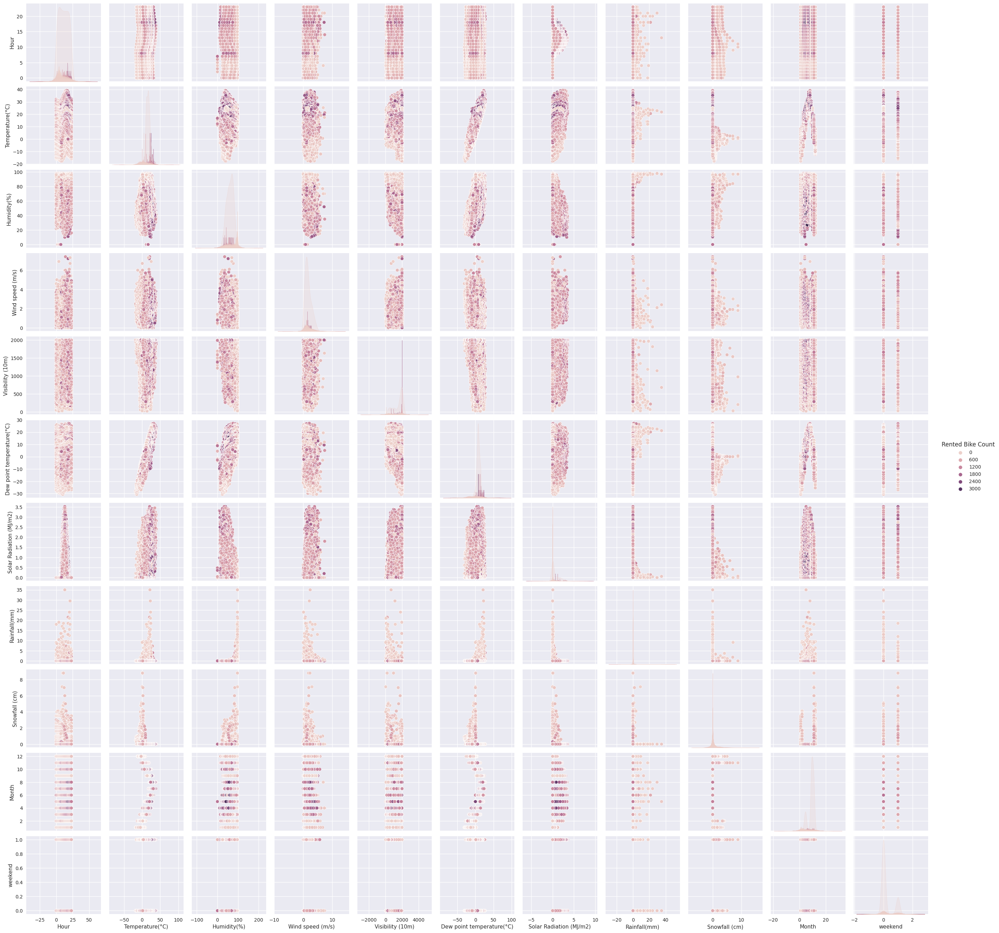

In [ ]:
# Pair Plot visualization code
sns.pairplot(dataset, hue="Rented Bike Count")

##### 1. Why did you pick the specific chart?

The Seaborn Pairplot allows us to plot pairwise relationships between variables within a dataset. This creates a nice visualisation and helps us understand the data by summarising a large amount of data in a single figure.

##### 2. What is/are the insight(s) found from the chart?

Rented Bike Count is more affected by heavy rainfall, snowfall.There is low count on weekends too.


---



## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

1. Does Humidity affect the Count of Bikes to be rented?  
2. Is there any relation between Visibility and Rented Bike Count?   
3. Is there any relation between rainfall and rented bike count?

### Hypothetical Statement - 1

Does Humidity affect the Count of Bikes to be rented?

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

H0:Number of bikes are not affected by Humidity 

H1:Number of bikes are  affected by Humidity

#### 2. Perform an appropriate statistical test.

In [ ]:
import pandas as pd
from scipy.stats import ttest_ind

# Load the data into a pandas DataFrame

# Extract the two columns of interest
column1 = dataset1['Rented Bike Count']
column2 = dataset1['Humidity(%)']

# Conduct a two-sample t-test
t_stat, p_val = ttest_ind(column1, column2)

# Print the results
print("T-statistic: ", t_stat)
print("P-value: ", p_val)

T-statistic:  93.74817439326853
P-value:  0.0


Here we accept our alternate hypothersis  
I.e No. of  Rented Bike Counts are affected by Humidity


##### Which statistical test have you done to obtain P-Value?

I have used two tailed t-test to obtain the value

##### Why did you choose the specific statistical test?

A two-tailed test is appropriate if you want to determine if there is any difference between the groups you are comparing

### Hypothetical Statement - 2

Is there any relation between Visibility and Rented Bike Count? 

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

H0:There is no relationship betwen Rented BIke Count and Visibility  
H1:There is relationship betwen Rented BIke Count and Visibility

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value
import scipy.stats as stats

# Create two arrays of data
x = dataset1['Rented Bike Count']
y = dataset1['Visibility (10m)']

# Calculate the Pearson correlation coefficient and p-value
corr_coef, p_value = stats.pearsonr(x, y)

# Print the results
print('Pearson correlation coefficient:', corr_coef)
print('P-value:', p_value)

Pearson correlation coefficient: 0.19928029673135897
P-value: 3.6727036659129486e-79


Our p value is belows 0.05 so we accept the alternate hypothesis


##### Which statistical test have you done to obtain P-Value?

Pearson correlation test is used by me

##### Why did you choose the specific statistical test?

The significance of PCC is basically to show you how strongly correlated the two variables/lists are

### Hypothetical Statement - 3

Is there any realtion between rainfall and rented bike count?

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

H0:There is relationship between Rented bike count and the rainfall  
H1:There is no relationship between Rented bike count and the rainfall  

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value
# Create a contingency table
cont_table = pd.crosstab(dataset1['Rented Bike Count'], dataset['Rainfall(mm)'])

# Conduct chi-square test
chi2_stat, p_val, dof, exp_freq = stats.chi2_contingency(cont_table)

# Print results
print("Chi-square statistic:", chi2_stat)
print("p-value:", p_val)

Chi-square statistic: 67628.30610774716
p-value: 1.0


we accept our null hypothesis

##### Which statistical test have you done to obtain P-Value?

I have used chi-square test here

##### Why did you choose the specific statistical test?

 chi-square test is a statistical test used to compare observed results with expected results. The purpose of this test is to determine if a difference between observed data and expected data is due to chance, or if it is due to a relationship between the variables you are studying

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [ ]:
# Handling Missing Values & Missing Value Imputation
dataset.isnull().sum()

Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
Day                          0
Month                        0
weekend                      0
dtype: int64

#### What all missing value imputation techniques have you used and why did you use those techniques?

There were no missing values present in the data

### 2. Handling Outliers

In [ ]:
dataset.sample(5)

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,Day,Month,weekend
4614,807,6,18.6,61,0.8,2000,10.9,0.03,0.0,0.0,Summer,No Holiday,Yes,Monday,6,0
8393,1416,17,13.7,38,1.4,884,-0.3,0.29,0.0,0.0,Autumn,No Holiday,Yes,Thursday,11,0
4681,715,1,20.8,72,1.0,912,15.5,0.00,0.0,0.0,Summer,No Holiday,Yes,Thursday,6,0
5523,393,3,24.4,85,0.6,678,21.7,0.00,0.0,0.0,Summer,No Holiday,Yes,Thursday,7,0
8286,117,6,6.6,84,1.2,373,4.0,0.00,0.0,0.0,Autumn,No Holiday,Yes,Sunday,11,1


In [ ]:
numerical_vars = ['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)']
Categorical_vars = ['Seasons',
       'Holiday', 'Functioning Day', 'Day']

In [ ]:
# total outliers for each column
Q1 = dataset[numerical_vars].quantile(0.25)
Q3 = dataset[numerical_vars].quantile(0.75)
IQR = Q3 - Q1
((dataset[numerical_vars] < (Q1 - 1.5 * IQR)) | (dataset[numerical_vars] > (Q3 + 1.5 * IQR))).sum()

Rented Bike Count            158
Hour                           0
Temperature(°C)                0
Humidity(%)                    0
Wind speed (m/s)             161
Visibility (10m)               0
Dew point temperature(°C)      0
Solar Radiation (MJ/m2)      641
Rainfall(mm)                 528
Snowfall (cm)                443
dtype: int64

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 [Text(0, 0, 'Rented Bike Count'),
  Text(1, 0, 'Hour'),
  Text(2, 0, 'Temperature(°C)'),
  Text(3, 0, 'Humidity(%)'),
  Text(4, 0, 'Wind speed (m/s)'),
  Text(5, 0, 'Visibility (10m)'),
  Text(6, 0, 'Dew point temperature(°C)'),
  Text(7, 0, 'Solar Radiation (MJ/m2)'),
  Text(8, 0, 'Rainfall(mm)'),
  Text(9, 0, 'Snowfall (cm)'),
  Text(10, 0, 'Month'),
  Text(11, 0, 'weekend')])

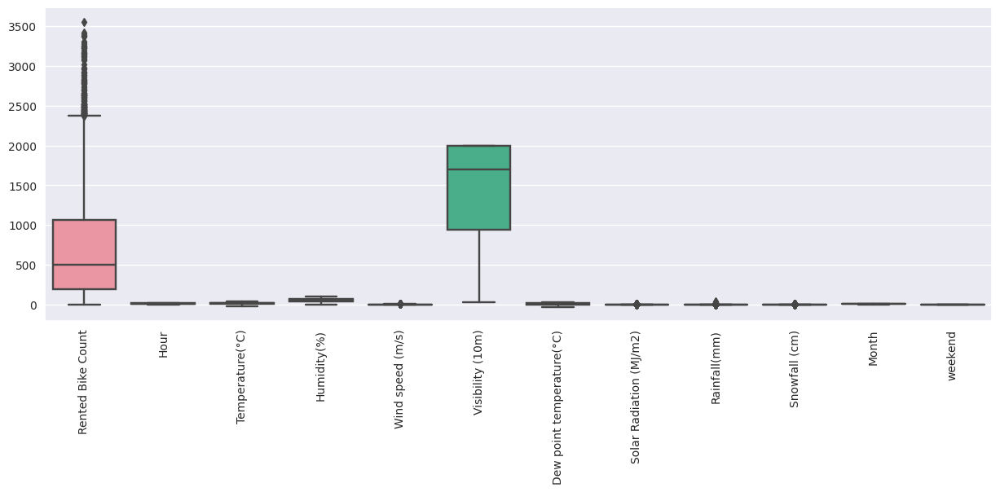

In [ ]:
plt.figure(figsize=(15,5))
sns.boxplot(data=dataset)
plt.xticks(rotation = 90)

<Axes: >

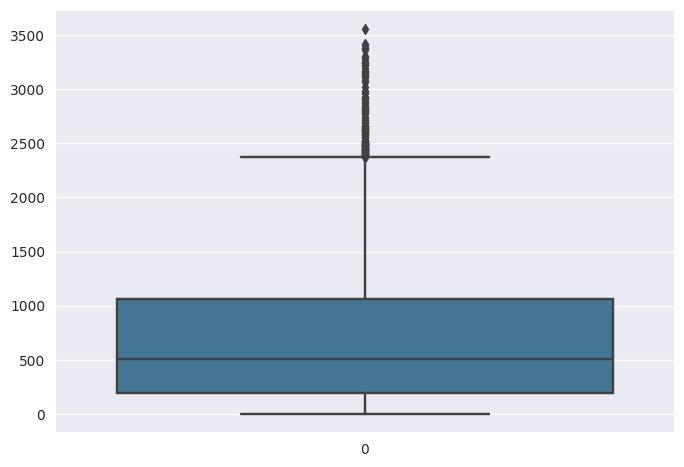

In [ ]:
sns.boxplot(dataset['Rented Bike Count'],palette="mako")

In [ ]:
# Finding the IQR
percentile25 =dataset['Rented Bike Count'].quantile(0.25)
percentile75 =dataset['Rented Bike Count'].quantile(0.75)

In [ ]:
q75, q25 = np.percentile(dataset['Rented Bike Count'],[75 ,25])
iqr = q75 - q25

In [ ]:
# Finding the upper and lower limits
upper_limit = percentile75 + 1.5 * iqr
lower_limit = percentile25 - 1.5 * iqr

In [ ]:
# Trimming outlier
new_df = dataset[dataset['Rented Bike Count'] < upper_limit]
new_df.shape

(8602, 16)

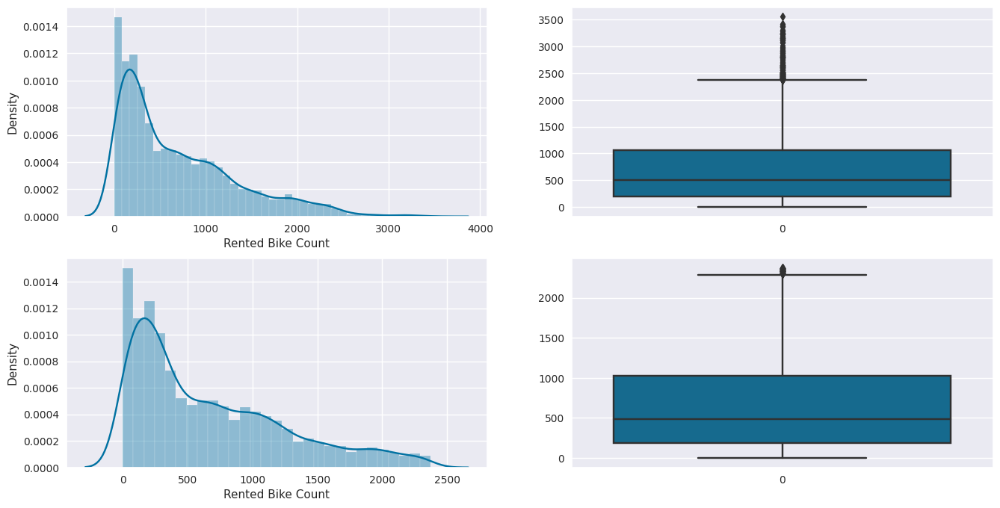

In [ ]:
# Comparing the plots after trimming 

plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
sns.distplot(dataset['Rented Bike Count'])
plt.subplot(2,2,2)
sns.boxplot(dataset['Rented Bike Count'])
plt.subplot(2,2,3)
sns.distplot(new_df['Rented Bike Count'])
plt.subplot(2,2,4)
sns.boxplot(new_df['Rented Bike Count'])
plt.show()

In [ ]:
# Capping
new_df_cap = dataset.copy()
new_df_cap['Rented Bike Count'] = np.where(new_df_cap['Rented Bike Count'] > upper_limit,upper_limit,
    np.where(new_df_cap['Rented Bike Count'] < lower_limit,lower_limit,new_df_cap['Rented Bike Count']))

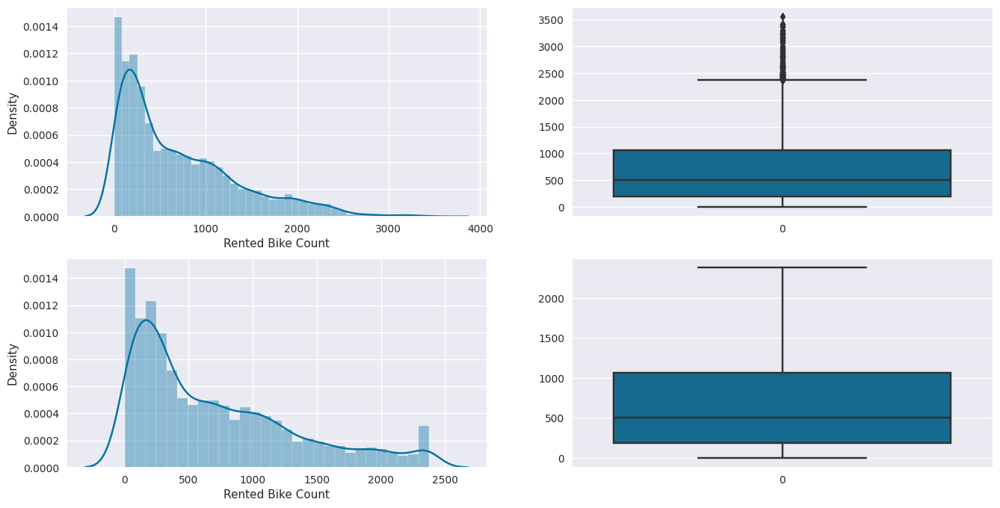

In [ ]:
# Comparing the plots after capping
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
sns.distplot(dataset['Rented Bike Count'])
plt.subplot(2,2,2)
sns.boxplot(dataset['Rented Bike Count'])
plt.subplot(2,2,3)
sns.distplot(new_df_cap['Rented Bike Count'])
plt.subplot(2,2,4)
sns.boxplot(new_df_cap['Rented Bike Count'])
plt.show()

<Axes: >

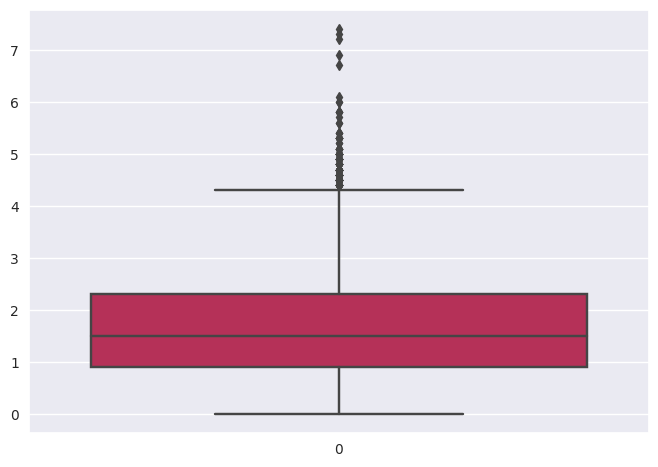

In [ ]:
sns.boxplot(dataset['Wind speed (m/s)'],palette='rocket')

In [ ]:
data_iqr1=  dataset['Wind speed (m/s)'].quantile(0.75)-dataset['Wind speed (m/s)'].quantile(0.25)
dataset['Wind speed (m/s)']= dataset['Wind speed (m/s)'].mask(dataset['Wind speed (m/s)']>(dataset['Wind speed (m/s)'].quantile(0.75)+1.5*data_iqr1), dataset['Wind speed (m/s)'].mean())


<Axes: >

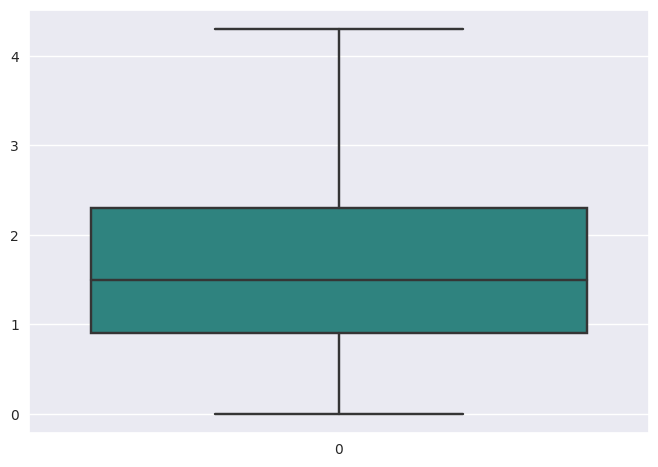

In [ ]:
sns.boxplot(dataset['Wind speed (m/s)'],palette='viridis')

<Axes: >

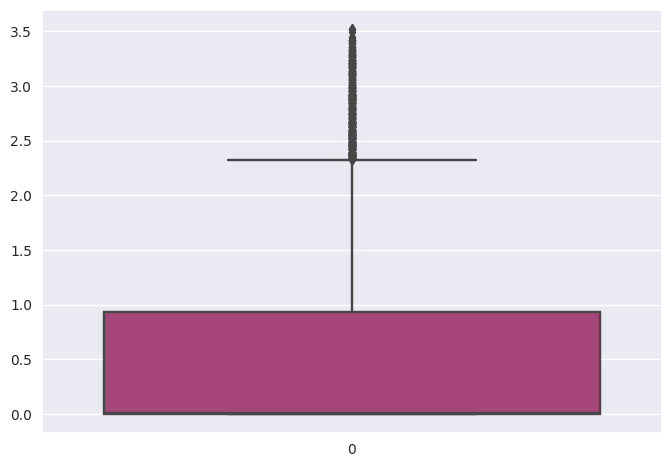

In [ ]:
sns.boxplot(dataset['Solar Radiation (MJ/m2)'],palette='magma')

In [ ]:
data_iqr1=  dataset['Solar Radiation (MJ/m2)'].quantile(0.75)-dataset['Solar Radiation (MJ/m2)'].quantile(0.25)
dataset['Solar Radiation (MJ/m2)']= dataset['Solar Radiation (MJ/m2)'].mask(dataset['Solar Radiation (MJ/m2)']>(dataset['Solar Radiation (MJ/m2)'].quantile(0.75)+1.5*data_iqr1), dataset['Solar Radiation (MJ/m2)'].mean())

<Axes: >

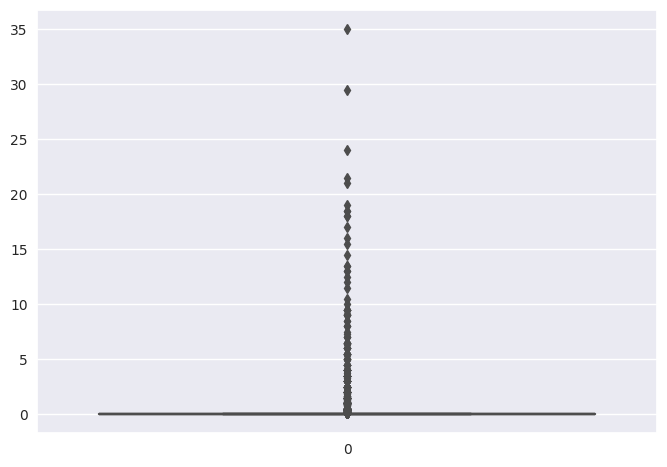

In [ ]:
sns.boxplot(dataset['Rainfall(mm)'],palette='flare')

In [ ]:
data_iqr1=  dataset['Rainfall(mm)'].quantile(0.75)-dataset['Rainfall(mm)'].quantile(0.25)
dataset['Rainfall(mm)']= dataset['Rainfall(mm)'].mask(dataset['Rainfall(mm)']>(dataset['Rainfall(mm)'].quantile(0.75)+1.5*data_iqr1), dataset['Rainfall(mm)'].mean())

<Axes: >

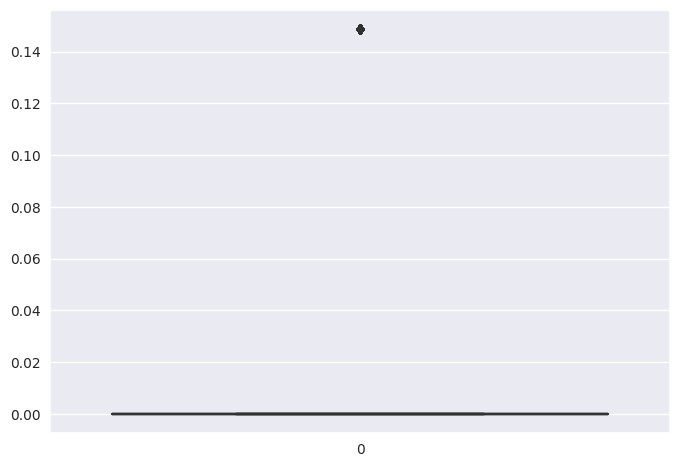

In [ ]:
sns.boxplot(dataset['Rainfall(mm)'])

<Axes: >

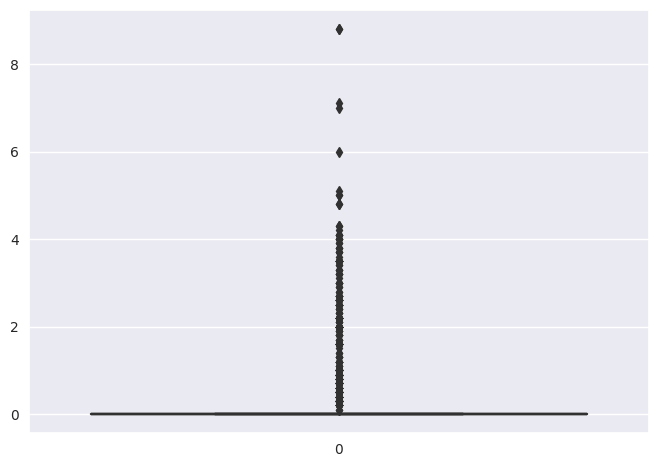

In [ ]:
sns.boxplot(dataset['Snowfall (cm)'])

In [ ]:
data_iqr1=  dataset['Snowfall (cm)'].quantile(0.75)-dataset['Snowfall (cm)'].quantile(0.25)
dataset['Snowfall (cm)']= dataset['Snowfall (cm)'].mask(dataset['Snowfall (cm)']>(dataset['Rainfall(mm)'].quantile(0.75)+1.5*data_iqr1), dataset['Snowfall (cm)'].mean())

<Axes: >

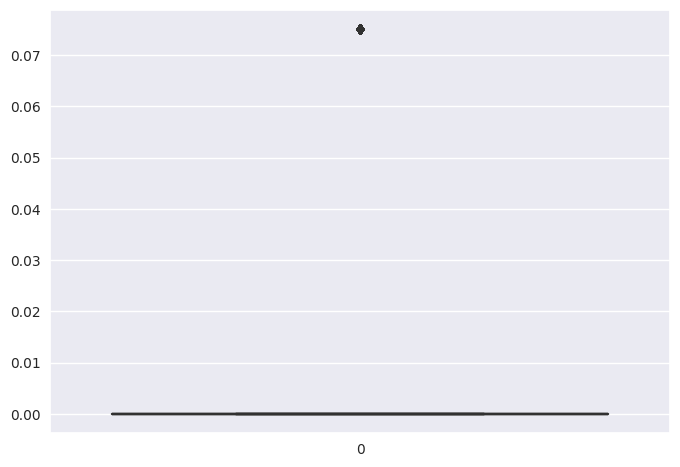

In [ ]:
sns.boxplot(dataset['Snowfall (cm)'])

##### What all outlier treatment techniques have you used and why did you use those techniques?

We have used the IQR method of identifying outliers to set up a “fence” outside of Q1 and Q3. Any values that fall outside of this fence are considered outliers. To build this fence we take 1.5 times the IQR and then subtract this value from Q1 and add this value to Q3. This gives us the minimum and maximum fence posts that we compare each observation to. Any observations that are more than 1.5 IQR below Q1 or more than 1.5 IQR above Q3 are considered outliers.
and after our rented bike count columns we just inputed the outliers with mean


### 3. Categorical Encoding

In [ ]:
from sklearn.preprocessing import OrdinalEncoder
enc = OrdinalEncoder()

In [ ]:
dataset.sample(5)

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,Day,Month,weekend
4644,1202,12,24.0,51,1.8,2000,13.2,2.29,0.0,0.000000,Summer,No Holiday,Yes,Tuesday,6,0
8325,1189,21,8.5,50,0.5,1707,-1.3,0.00,0.0,0.000000,Autumn,No Holiday,Yes,Monday,11,0
1183,334,7,-2.0,49,1.9,1281,-11.3,0.00,0.0,0.000000,Winter,No Holiday,Yes,Friday,1,0
7653,1556,21,15.5,86,1.3,178,13.1,0.00,0.0,0.000000,Autumn,No Holiday,Yes,Monday,10,0
433,122,1,-2.0,72,0.8,979,-6.3,0.00,0.0,0.075068,Winter,No Holiday,Yes,Tuesday,12,0


In [ ]:
categorical_columns=list(set(dataset.columns.to_list()).difference(set(dataset.describe().columns.to_list())))
print("Categorical Columns are :-", categorical_columns)

Categorical Columns are :- ['Functioning Day', 'Seasons', 'Holiday', 'Day']


In [ ]:
# Encode your categorical columns
dataset['Functioning Day']=dataset['Functioning Day'].map({'Yes':1,'No':0})
dataset['Holiday']=dataset['Holiday'].map({'No Holiday':0,'Holiday':1})

In [ ]:
dataset_seasons=pd.get_dummies( dataset['Seasons'] )
dataset_Day=pd.get_dummies(dataset['Day'])


In [ ]:
dataset=dataset.drop(columns = ['Seasons','Day'])

In [ ]:
dataset.sample(5)

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Functioning Day,Month,weekend
6088,826,16,35.6,39,2.7,2000,19.5,1.81,0.0,0.0,0,1,8,1
847,327,7,-5.3,53,1.1,1300,-13.4,0.00,0.0,0.0,0,1,1,0
531,230,3,5.4,77,1.6,583,1.6,0.00,0.0,0.0,0,1,12,1
7179,355,3,16.5,57,1.6,2000,7.9,0.00,0.0,0.0,0,1,9,0
1006,172,22,-12.9,52,2.8,2000,-20.7,0.00,0.0,0.0,0,1,1,0


#### What all categorical encoding techniques have you used & why did you use those techniques?

Here we did ordinal encoding because, This type of encoding is used when the variables in the data are ordinal, ordinal encoding converts each label into integer values and the encoded data represents the sequence of labels.  
One_hot encoding is used for Day and Month. 

### 4. Feature Manipulation & Selection

#### 1. Feature Manipulation

we created new feature as weekend to understand the distribution of count between weekdays and weekends and we did the eda for better visualization.

#### 2. Feature Selection

In [ ]:
# Select your features wisely to avoid overfitting
corr = dataset.corr()
corr.style.background_gradient(cmap='ocean')

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Functioning Day,Month,weekend
Rented Bike Count,1.000000,0.410257,0.538558,-0.199780,0.149735,0.199280,0.379788,0.244448,-0.212493,-0.185897,-0.072338,0.203943,0.133514,-0.036467
Hour,0.410257,1.000000,0.124114,-0.241644,0.288900,0.098753,0.003054,0.151439,-0.027163,-0.032174,-0.000000,0.005439,0.000000,-0.000000
Temperature(°C),0.538558,0.124114,1.000000,0.159371,-0.013841,0.034794,0.912798,0.250164,0.074539,-0.333068,-0.055931,-0.050170,0.216183,0.007214
Humidity(%),-0.199780,-0.241644,0.159371,1.000000,-0.325814,-0.543090,0.536894,-0.408278,0.397966,0.051090,-0.050278,-0.020800,0.139875,-0.016951
Wind speed (m/s),0.149735,0.288900,-0.013841,-0.325814,1.000000,0.166316,-0.152174,0.295404,-0.058501,0.037937,0.018435,0.007913,-0.152647,-0.021739
Visibility (10m),0.199280,0.098753,0.034794,-0.543090,0.166316,1.000000,-0.176630,0.130473,-0.257128,-0.085726,0.031773,-0.026000,0.064874,-0.026762
Dew point temperature(°C),0.379788,0.003054,0.912798,0.536894,-0.152174,-0.176630,1.000000,0.036330,0.205161,-0.267431,-0.066759,-0.052837,0.242552,-0.006990
Solar Radiation (MJ/m2),0.244448,0.151439,0.250164,-0.408278,0.295404,0.130473,0.036330,1.000000,-0.123349,-0.065762,-0.003255,-0.012596,-0.010907,-0.000705
Rainfall(mm),-0.212493,-0.027163,0.074539,0.397966,-0.058501,-0.257128,0.205161,-0.123349,1.000000,0.002843,-0.011161,0.015371,0.012556,-0.010035
Snowfall (cm),-0.185897,-0.032174,-0.333068,0.051090,0.037937,-0.085726,-0.267431,-0.065762,0.002843,1.000000,0.007587,0.043084,-0.017834,-0.033730


In [ ]:
dataset.columns

Index(['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Holiday',
       'Functioning Day', 'Month', 'weekend'],
      dtype='object')

In [ ]:
numerical_variables = ['Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)','Month','weekend']

In [ ]:
numerical_feature_df = pd.DataFrame(dataset[numerical_variables])

In [ ]:
# Definig function for VIF:

def calc_vif(X):
 
   # Calculating VIF:
   
   vif = pd.DataFrame()
   vif["variables"] = X.columns
   vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
 
   return(vif)

In [ ]:
calc_vif(dataset[[i for i in numerical_feature_df.describe().columns]])

,variables,VIF
0,Hour,4.354879
1,Temperature(°C),29.240752
2,Humidity(%),7.509933
3,Wind speed (m/s),5.231698
4,Visibility (10m),9.070509
5,Dew point temperature(°C),16.034051
6,Solar Radiation (MJ/m2),2.171667
7,Rainfall(mm),1.261707
8,Snowfall (cm),1.219353
9,Month,5.076318


In [ ]:
calc_vif(dataset[[i for i in numerical_feature_df.describe().columns if i not in ['Temperature(°C)']]])

,variables,VIF
0,Hour,3.928971
1,Humidity(%),6.932302
2,Wind speed (m/s),4.916690
3,Visibility (10m),5.705263
4,Dew point temperature(°C),1.667883
5,Solar Radiation (MJ/m2),1.775421
6,Rainfall(mm),1.256957
7,Snowfall (cm),1.205579
8,Month,4.954081
9,weekend,1.384899


In [ ]:
dataset=dataset.drop(columns=['Temperature(°C)'],axis=1)

In [ ]:
# defining function for feature importance:
def get_feat_imp(model):
  feat_importances = pd.Series(model.feature_importances_, index=X.columns)
  plt.figure(figsize=(15,8))
  plt.title('Feature Importance')
  feat_importances.nlargest(10).plot(kind='bar', color= 'red',path_effects=[path_effects.SimplePatchShadow(),path_effects.Normal()])
  plt.show()

##### What all feature selection methods have you used  and why?

First I checked the corrleation map of our dataset to see which of the features are correlated... then i used Vif as we known  
A variance inflation factor (VIF) is a measure of the amount of multicollinearity in regression analysis. Multicollinearity exists when there is a correlation between multiple independent variables in a multiple regression model. This can adversely affect the regression results. Thus, the variance inflation factor can estimate how much the variance of a regression coefficient is inflated due to multicollinearity.

##### Which all features you found important and why?

Here i found features...such as  
 
1 Hour  

2	Humidity(%)  

3	Wind speed (m/s)  

4	Visibility (10m)  

5	Dew point temperature(°C)  

6	Solar Radiation (MJ/m2)  

7	Rainfall(mm)  

8	Snowfall (cm)  

9	Holiday  

10 Month    

11 weekend  

as there vif value is less than 10 and they are less correlated...

### 5. Data Transformation

#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

<Figure size 1000x600 with 0 Axes>

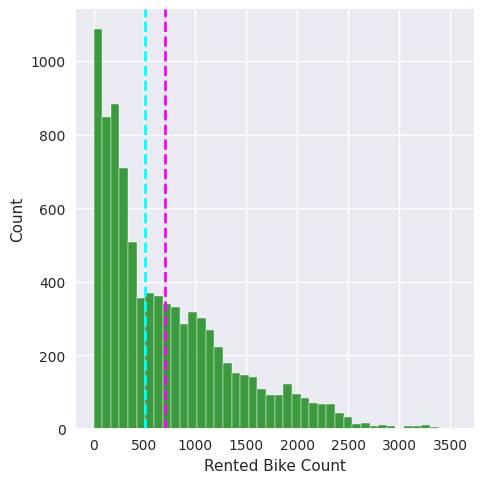

<Figure size 1000x600 with 0 Axes>

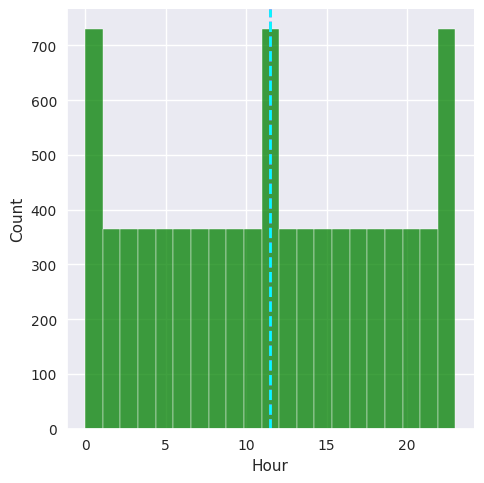

<Figure size 1000x600 with 0 Axes>

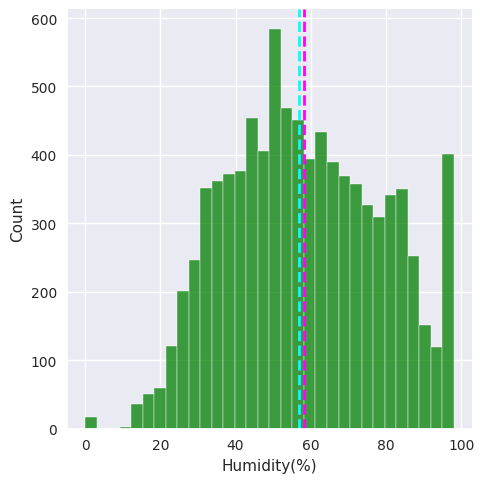

<Figure size 1000x600 with 0 Axes>

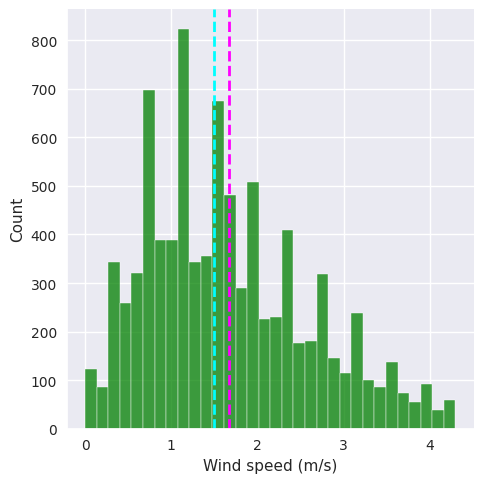

<Figure size 1000x600 with 0 Axes>

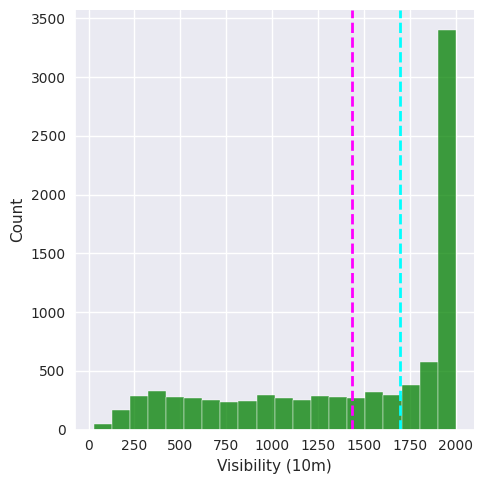

<Figure size 1000x600 with 0 Axes>

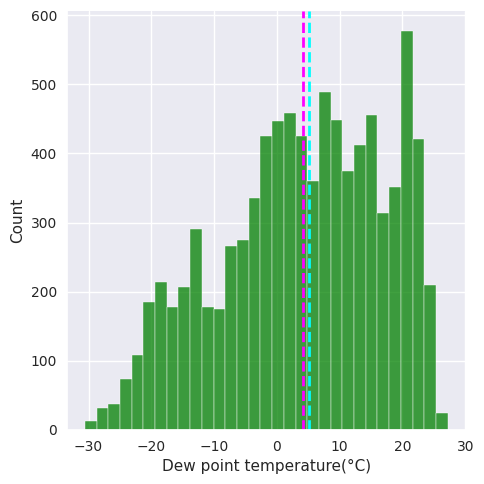

<Figure size 1000x600 with 0 Axes>

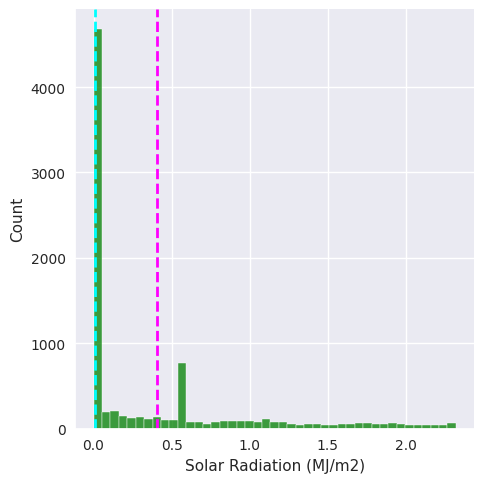

<Figure size 1000x600 with 0 Axes>

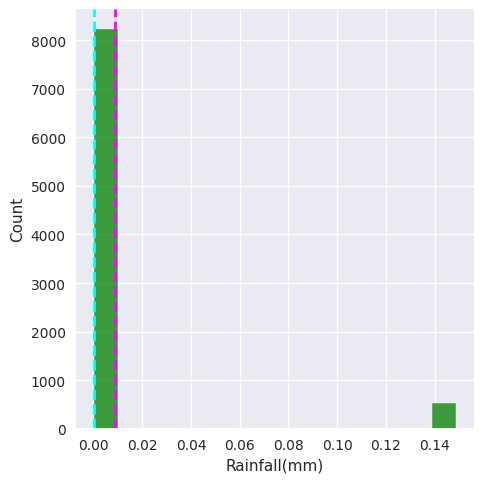

<Figure size 1000x600 with 0 Axes>

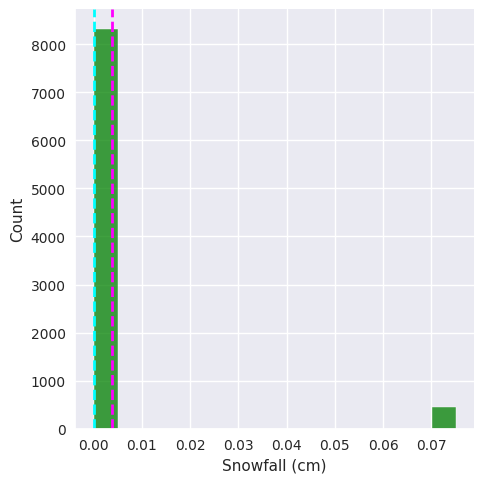

<Figure size 1000x600 with 0 Axes>

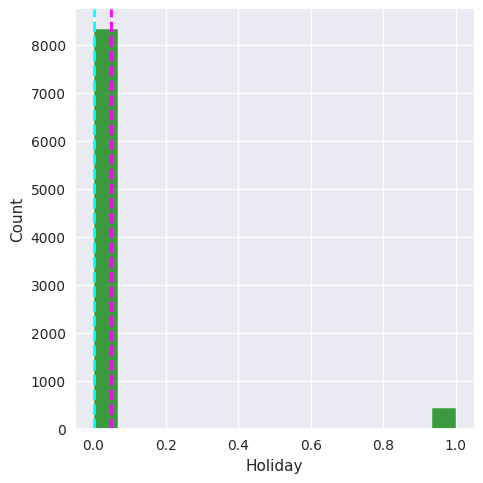

<Figure size 1000x600 with 0 Axes>

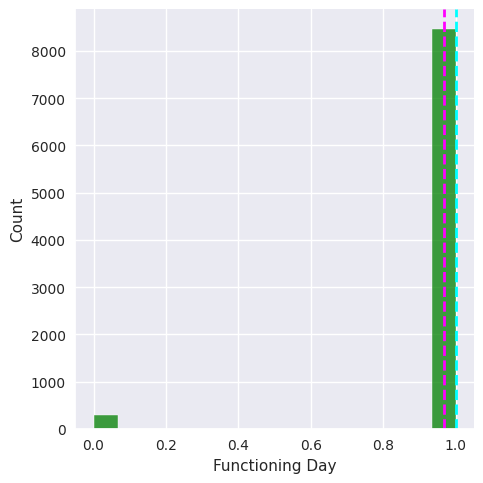

<Figure size 1000x600 with 0 Axes>

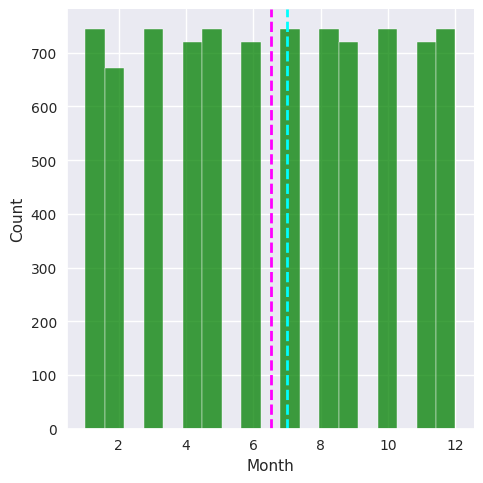

<Figure size 1000x600 with 0 Axes>

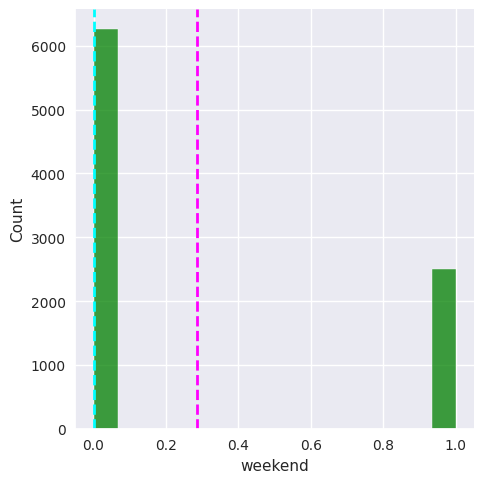

In [ ]:
# Transform Your data
for col in dataset:
  plt.figure(figsize=(10,6))
  sns.displot(x=dataset[col] , color ='green')
  plt.xlabel(col)
  plt.axvline(dataset[col].mean(),color='magenta', linestyle='dashed',linewidth=2)
  plt.axvline(dataset[col].median(),color='cyan', linestyle='dashed',linewidth=2)
  plt.show()
plt.show()

In [ ]:
dataset['Rented Bike Count']=np.sqrt(dataset['Rented Bike Count'])

In [ ]:
print(dataset.skew())

Rented Bike Count            0.237362
Hour                         0.000000
Humidity(%)                  0.059579
Wind speed (m/s)             0.612597
Visibility (10m)            -0.701786
Dew point temperature(°C)   -0.367298
Solar Radiation (MJ/m2)      1.526449
Rainfall(mm)                 3.695907
Snowfall (cm)                4.102840
Holiday                      4.163603
Functioning Day             -5.170969
Month                       -0.010458
weekend                      0.953097
dtype: float64


Text(0.5, 0, 'Rented Bike Count')

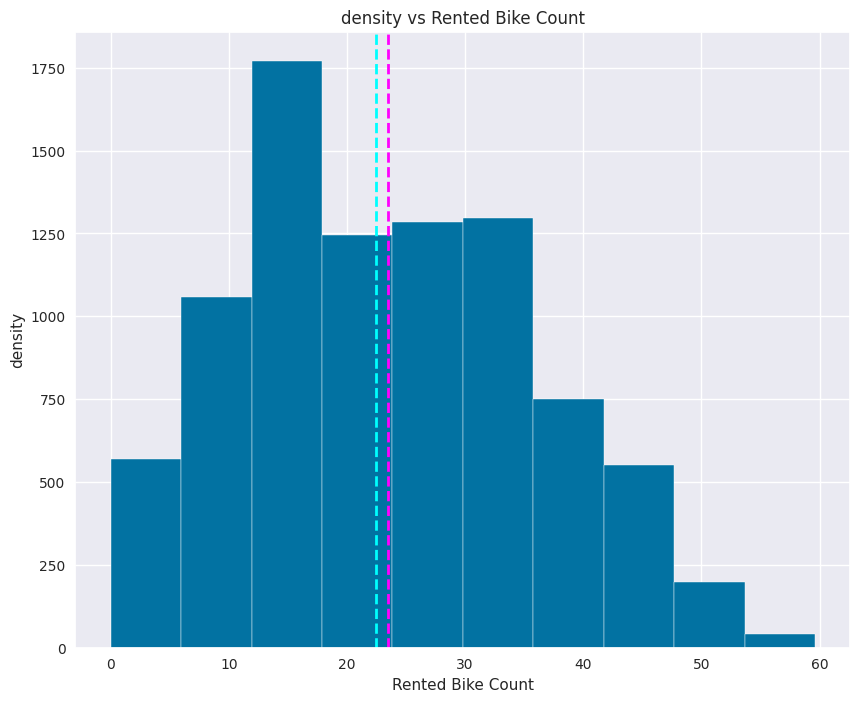

In [ ]:
dataset.hist('Rented Bike Count',figsize=(10,8))
plt.title('density vs Rented Bike Count')
plt.axvline(dataset['Rented Bike Count'].mean(),color='magenta', linestyle='dashed',linewidth=2)
plt.axvline(dataset['Rented Bike Count'].median(),color='cyan', linestyle='dashed',linewidth=2)
plt.ylabel('density')
plt.xlabel('Rented Bike Count')

 As we are concern more towards our Targer column so, Accordingly our target feature is rented bike count so we did the required  square root transformation.

### 6. Data Scaling

In [ ]:
# Scaling your data
from numpy import asarray
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaled = scaler.fit_transform(dataset)
print(scaled)

[[0.26726124 0.         0.37755102 ... 1.         1.         0.        ]
 [0.23951582 0.04347826 0.3877551  ... 1.         1.         0.        ]
 [0.22056783 0.08695652 0.39795918 ... 1.         1.         0.        ]
 ...
 [0.44177268 0.91304348 0.39795918 ... 1.         0.90909091 0.        ]
 [0.44746505 0.95652174 0.41836735 ... 1.         0.90909091 0.        ]
 [0.40525236 1.         0.43877551 ... 1.         0.90909091 0.        ]]


In [ ]:
# Creating copy of data:

data_ml= dataset.copy()

# Creating the data of dependent and independent variables:
y = data_ml['Rented Bike Count']
X = data_ml.drop(columns=['Rented Bike Count'], axis=1)

In [ ]:
X

,Hour,Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Functioning Day,Month,weekend
0,0,37,2.2,2000,-17.6,0.0,0.0,0.0,0,1,12,0
1,1,38,0.8,2000,-17.6,0.0,0.0,0.0,0,1,12,0
2,2,39,1.0,2000,-17.7,0.0,0.0,0.0,0,1,12,0
3,3,40,0.9,2000,-17.6,0.0,0.0,0.0,0,1,12,0
4,4,36,2.3,2000,-18.6,0.0,0.0,0.0,0,1,12,0
...,...,...,...,...,...,...,...,...,...,...,...,...
8755,19,34,2.6,1894,-10.3,0.0,0.0,0.0,0,1,11,0
8756,20,37,2.3,2000,-9.9,0.0,0.0,0.0,0,1,11,0
8757,21,39,0.3,1968,-9.9,0.0,0.0,0.0,0,1,11,0
8758,22,41,1.0,1859,-9.8,0.0,0.0,0.0,0,1,11,0


##### Which method have you used to scale you data and why?

Scaling the target value is a good idea in regression modelling; scaling of the data makes it easy for a model to learn and understand the problem. Scaling of the data comes under the set of steps of data pre-processing when we are performing machine learning algorithms in the data set.  
I have used Minmaxscaler technique here as we know MinMaxScaler is used when the upper and lower boundaries are well known from domain knowledge. MinMaxScaler scales all the data features in the range [0, 1] or else in the range [-1, 1] if there are negative values in the dataset. This scaling compresses all the inliers in the narrow range.

### 7. Dimesionality Reduction

No it is not required

### 8. Data Splitting

In [ ]:
# Split your data to train and test. Choose Splitting ratio wisely.
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=42)
print(X_train.shape)
print(X_test.shape)

(7008, 12)
(1752, 12)


In [ ]:
# Defining function for plotting y test  and y train values:
def get_linear_graph(pred_value, y_test ):
  plt.figure(figsize=(15,7))
  plt.plot(pred_value[:100])
  plt.plot(np.array(y_test[:100]))
  plt.legend(['Predicted','Actual'])
  plt.show()

##### What data splitting ratio have you used and why? 

I Have used splitting ratio of 80:20 as it is consider to be the best ratio for model training i.e 80% for trainig and 20% for testing.

### 9. Handling Imbalanced Dataset

In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Rented Bike Count          8760 non-null   float64
 1   Hour                       8760 non-null   int64  
 2   Humidity(%)                8760 non-null   int64  
 3   Wind speed (m/s)           8760 non-null   float64
 4   Visibility (10m)           8760 non-null   int64  
 5   Dew point temperature(°C)  8760 non-null   float64
 6   Solar Radiation (MJ/m2)    8760 non-null   float64
 7   Rainfall(mm)               8760 non-null   float64
 8   Snowfall (cm)              8760 non-null   float64
 9   Holiday                    8760 non-null   int64  
 10  Functioning Day            8760 non-null   int64  
 11  Month                      8760 non-null   int64  
 12  weekend                    8760 non-null   int64  
dtypes: float64(6), int64(7)
memory usage: 889.8 KB


No the data is not imbalanced

## ***7. ML Model Implementation***

### ML Model - 1 - Linear Regression

In [ ]:
# Fitting onto Linear regression Model:

reg= LinearRegression().fit(X_train, y_train)

# Getting the X_train and X-test value:
y_pred_train=reg.predict(X_train)
y_pred_test=reg.predict(X_test)

In [ ]:
reg.score(X_train, y_train)

0.66103417942984

In [ ]:
reg.coef_

array([ 5.12669129e-01, -2.31330765e-01,  1.89881198e-01,  2.82227946e-04,
        5.81856635e-01,  5.08423247e-01, -8.03970934e+01, -1.65353849e+01,
       -3.87167062e+00,  2.74336896e+01,  3.59678697e-01, -1.35624662e+00])

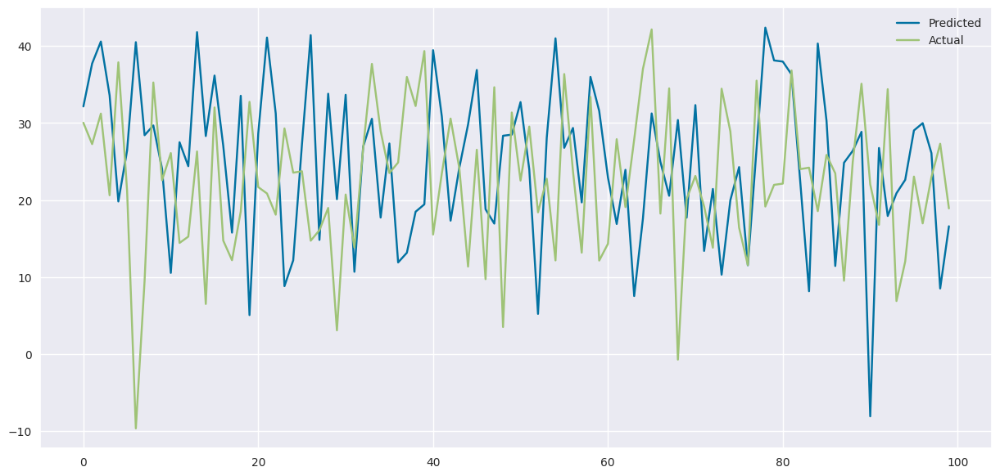

In [ ]:
get_linear_graph(y_pred_test,y_pred_train)

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [ ]:
# Visualizing evaluation Metric Score chart
# Calculate MSE, MAE, R2 for training data:
MSEl = mean_squared_error((y_train), (y_pred_train))
MAEl= mean_absolute_error(y_train, y_pred_train)
r2l = r2_score(y_train, y_pred_train)

In [ ]:
# Calculate MSE, MAE, R2 for testing data:
MSEtestl = mean_squared_error((y_test), (y_pred_test))
MAEtestl= mean_absolute_error(y_test, y_pred_test)
r2testl = r2_score(y_test, y_pred_test)
# Printing Errors:

In [ ]:
# Printing Errors:

print('Training Errors\nMSE:', MSEl , '\nMAE:' , MAEl , '\nR2:',round((r2l),3))
print('\n\nTesting Errors\nMSE:', MSEtestl , '\nMAE:' , MAEtestl , '\nR2:',round((r2testl),3))

Training Errors
MSE: 52.63544647202012 
MAE: 5.672191811870661 
R2: 0.661


Testing Errors
MSE: 53.97498995249902 
MAE: 5.709111477377919 
R2: 0.649


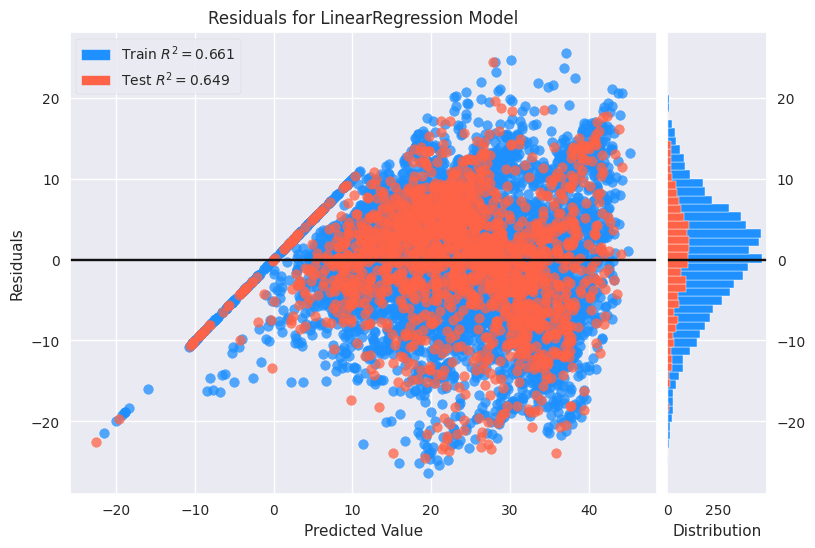

<Axes: title={'center': 'Residuals for LinearRegression Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [ ]:
viz = ResidualsPlot(LinearRegression(),
                    train_color="dodgerblue",
                    test_color="tomato",
                    fig=plt.figure(figsize=(9,6))
                    )

viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

A residual is a measure of how far away a point is vertically from the regression line. Simply, it is the error between a predicted value and the observed actual value.

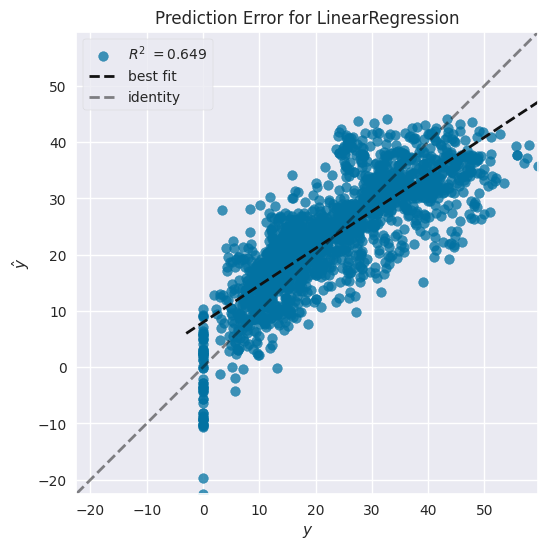

<Axes: title={'center': 'Prediction Error for LinearRegression'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [ ]:
viz = PredictionError(LinearRegression(),
                      fig=plt.figure(figsize=(6,6))
                      )

viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

It's a measure of how well the model predicts the response variable.

In [ ]:
# storing the train set metrics value in a dataframe for later comparison:

dict1={'Model':'Linear regression ',
       'MAE':round((MAEl),3),
       'MSE':round((MSEl),3),
       'R2_score':round((r2l),3),
       }
training_df=pd.DataFrame(dict1,index=[1])

In [ ]:
# storing the test set metrics value in a dataframe for later comparison:
dict2={'Model':'Linear regression ',
       'MAE':round((MAEtestl),3),
       'MSE':round((MSEtestl),3),
       'R2_score':round((r2testl),3)
       }
test_df=pd.DataFrame(dict2,index=[1])

#### 2. Cross- Validation & Hyperparameter Tuning

We haven't done hyperparameter tuning for this model.

### ML Model - 2 - Polynomial Regression and Decision Tree

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [ ]:
# Visualizing evaluation Metric Score chart
from sklearn.preprocessing import PolynomialFeatures
# Fitting training data onto Polynomial regression Model :
poly_reg = PolynomialFeatures(degree = 2)

X_poly = poly_reg.fit_transform(X_train)

X_poly_test = poly_reg.fit_transform(X_test)

In [ ]:
# Fitting training data onto Polynomial regression Model :
poly_reg = PolynomialFeatures(degree = 2)
X_poly = poly_reg.fit_transform(X_train)
X_poly_test = poly_reg.fit_transform(X_test)

In [ ]:
# Fitting training data onto Polynomial regression Model:
poly = LinearRegression().fit(X_poly, y_train)

In [ ]:
X_poly

array([[  1.,  15.,  61., ..., 121.,   0.,   0.],
       [  1.,   9.,  86., ...,  36.,   0.,   0.],
       [  1.,  19.,  46., ..., 121.,   0.,   0.],
       ...,
       [  1.,  14.,  62., ...,  49.,   0.,   0.],
       [  1.,  20.,  51., ...,   1.,   0.,   0.],
       [  1.,  22.,  55., ...,  81.,   9.,   1.]])

In [ ]:
X_poly_test

array([[ 1.,  8., 69., ..., 64.,  0.,  0.],
       [ 1., 12., 51., ..., 49.,  0.,  0.],
       [ 1., 14., 50., ..., 64.,  0.,  0.],
       ...,
       [ 1.,  5., 65., ..., 81.,  9.,  1.],
       [ 1.,  7., 70., ...,  4.,  0.,  0.],
       [ 1., 13., 48., ..., 64.,  0.,  0.]])

In [ ]:
 # Getting the y_train and y-test value:
y_pred_poly_train = poly.predict(X_poly)
y_pred_poly_test= poly.predict(X_poly_test)

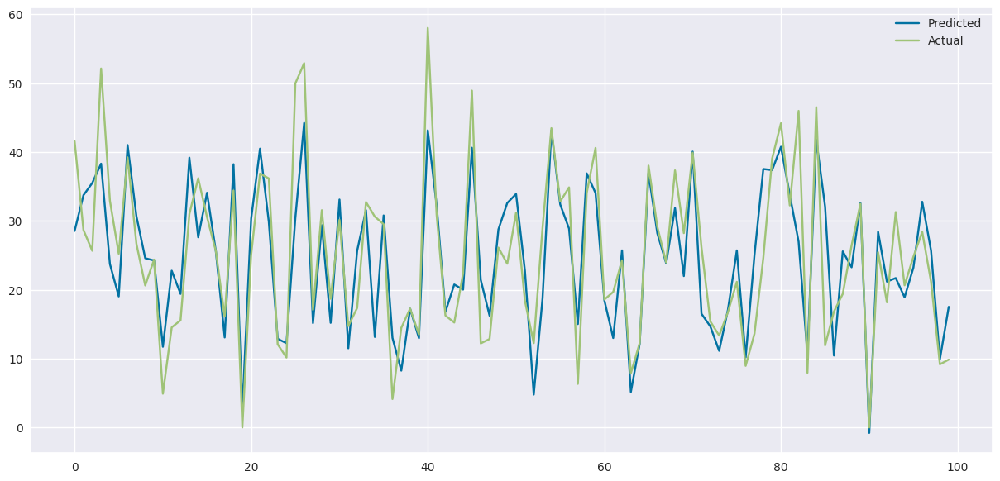

In [ ]:
get_linear_graph(y_pred_poly_test , y_test )

In [ ]:
# Calculate MSE, MAE, R2 for training data:
MSEp = mean_squared_error((y_train), (y_pred_poly_train))
MAEp= mean_absolute_error(y_train, y_pred_poly_train)
r2p = r2_score(y_train, y_pred_poly_train)

In [ ]:
# Calculate MSE, MAE, R2 for testing data:
MSEtestp = mean_squared_error((y_test), (y_pred_poly_test))
MAEtestp= mean_absolute_error(y_test, y_pred_poly_test)
r2testp = r2_score(y_test, y_pred_poly_test)

In [ ]:
# Printing Errors:
print('Training Errors\nMSE:', MSEp , '\nMAE:' , MAEp , '\nR2:',round((r2p),2))
print('\n\nTesting Errors\nMSE:', MSEtestp , '\nMAE:' , MAEtestp , '\nR2:',round((r2testp),2))

Training Errors
MSE: 36.05917063979719 
MAE: 4.557422062205761 
R2: 0.77


Testing Errors
MSE: 39.05381880809269 
MAE: 4.70632223947774 
R2: 0.75


In [ ]:
# storing the train set metrics value in a dataframe for later comparison:
dict1={'Model':'Polynomial regression ',
       'MAE':round((MAEp),3),
       'MSE':round((MSEp),3),
       'R2_score':round((r2p),3)
       }
training_df=training_df.append(dict1,ignore_index=True)
# storing the test set metrics value in a dataframe for later comparison:

dict2={'Model':'Polynomial regression ',
       'MAE':round((MAEtestp),3),
       'MSE':round((MSEtestp),3),
       'R2_score':round((r2testp),3)
       }
test_df=test_df.append(dict2,ignore_index=True)

#### 2. Cross- Validation & Hyperparameter Tuning

##### Which hyperparameter optimization technique have you used and why?

We didn't perfrom hyperparameter tuning for this model.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

IT has shown slight improvement in the model as compared to above linear regression model.

# Decision Tree

In [ ]:
# ML Model - 3 Implementation
# Creating object wth Decision tree regressor with critera of mean squared error, maximum depth being 10, maximum leaf noodes being 120:
from sklearn.tree import DecisionTreeRegressor
decision_regressor = DecisionTreeRegressor(criterion='squared_error', max_depth=10, max_leaf_nodes=120)
decision_regressor.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=10, max_leaf_nodes=120)

In [ ]:
# Getting the y_train and y-test value:
y_pred_train_d = decision_regressor.predict(X_train)
y_pred_test_d = decision_regressor.predict(X_test)

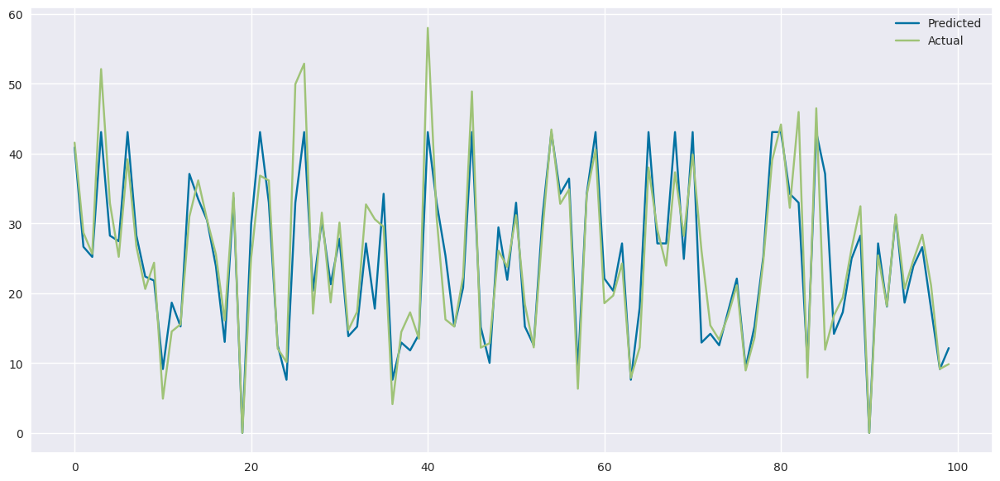

In [ ]:
get_linear_graph(y_pred_test_d , y_test )

In [ ]:
# Calculate MSE, MAE, R2 for training data:
MSEdt = mean_squared_error((y_train), (y_pred_train_d))
MAEdt = mean_absolute_error(y_train, y_pred_train_d)
r2dt = r2_score(y_train, y_pred_train_d)

In [ ]:
# Calculate MSE, MAE, R2 for testing data:
MSEtestdt = mean_squared_error((y_test), (y_pred_test_d))
MAEtestdt = mean_absolute_error(y_test, y_pred_test_d)
r2testdt = r2_score(y_test, y_pred_test_d)

In [ ]:
# Printing Errors:
print('Training Errors\nMSE:', MSEdt , '\nMAE:' , MAEdt , '\nR2:',round((r2dt),3))
print('\n\nTesting Errors\nMSE:', MSEtestdt , '\nMAE:' , MAEtestdt , '\nR2:',round((r2testdt),3))

Training Errors
MSE: 19.20193680820102 
MAE: 3.1369281432464233 
R2: 0.876


Testing Errors
MSE: 22.782959937562733 
MAE: 3.3712667165211583 
R2: 0.852


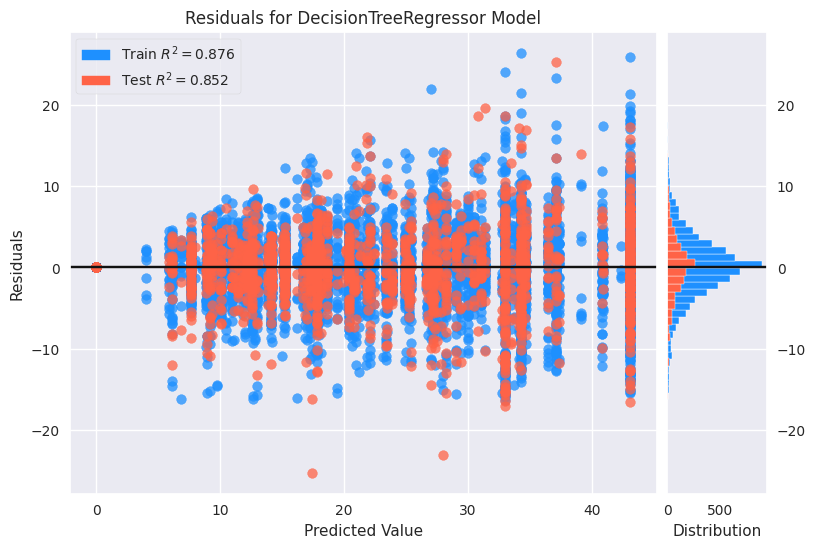

<Axes: title={'center': 'Residuals for DecisionTreeRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [ ]:
viz = ResidualsPlot(DecisionTreeRegressor(criterion='squared_error', max_depth=10, max_leaf_nodes=120),
                    train_color="dodgerblue",
                    test_color="tomato",
                    fig=plt.figure(figsize=(9,6))
                    )

viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

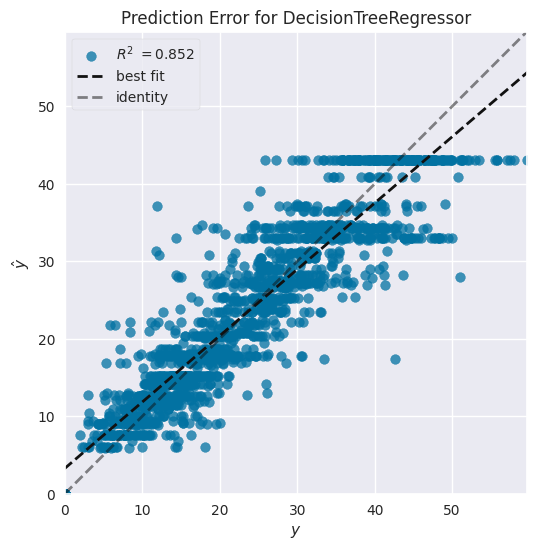

<Axes: title={'center': 'Prediction Error for DecisionTreeRegressor'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [ ]:
viz = PredictionError(DecisionTreeRegressor(criterion='squared_error', max_depth=10, max_leaf_nodes=120),
                      fig=plt.figure(figsize=(6,6))
                      )

viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

In [ ]:
# storing the train set metrics value in a dataframe for later comparison:

dict1={'Model':'Decision Tree Regression ',
       'MAE':round((MAEdt),3),
       'MSE':round((MSEdt),3),
       'R2_score':round((r2dt),3),
}
training_df=training_df.append(dict1,ignore_index=True)
# storing the test set metrics value in a dataframe for later comparison
dict2 = {'Model':'Decision Tree Regression ',
       'MAE':round((MAEtestdt),3),
       'MSE':round((MSEtestdt),3),
       'R2_score':round((r2testdt),3),
}
test_df=test_df.append(dict2,ignore_index=True)

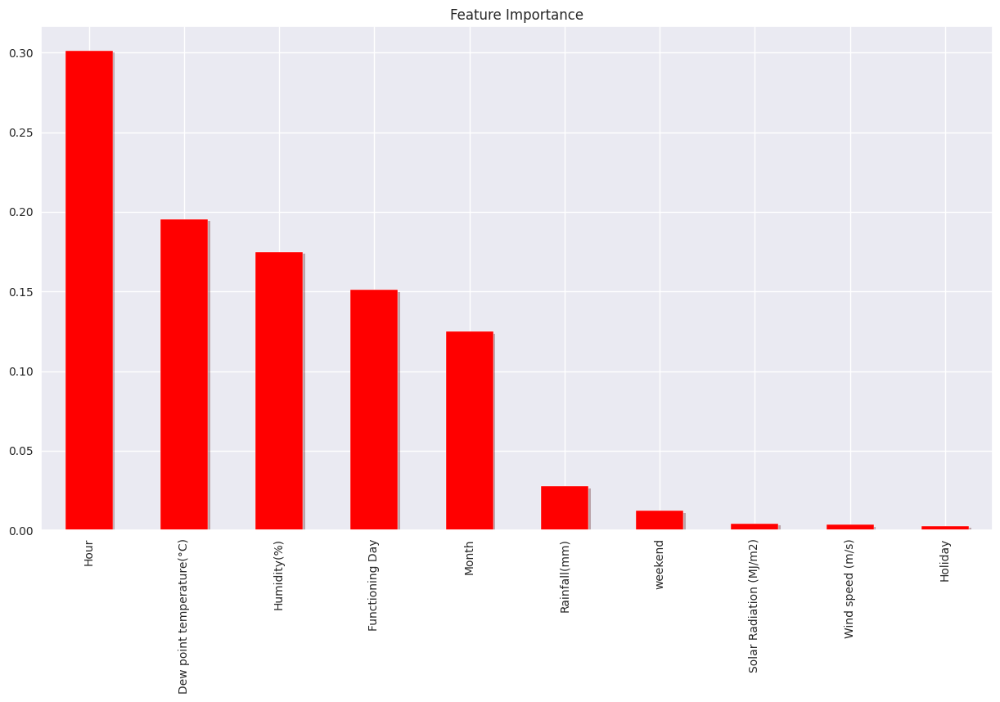

In [ ]:
get_feat_imp(decision_regressor)

### ML Model - 3 --  Random Forest

In [ ]:
Rf = RandomForestRegressor(n_estimators=100, random_state=42)
Rf.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [ ]:
# Getting the y_train and y-test value:
y_pred_train_Rf = Rf.predict(X_train)
y_pred_test_Rf = Rf.predict(X_test)

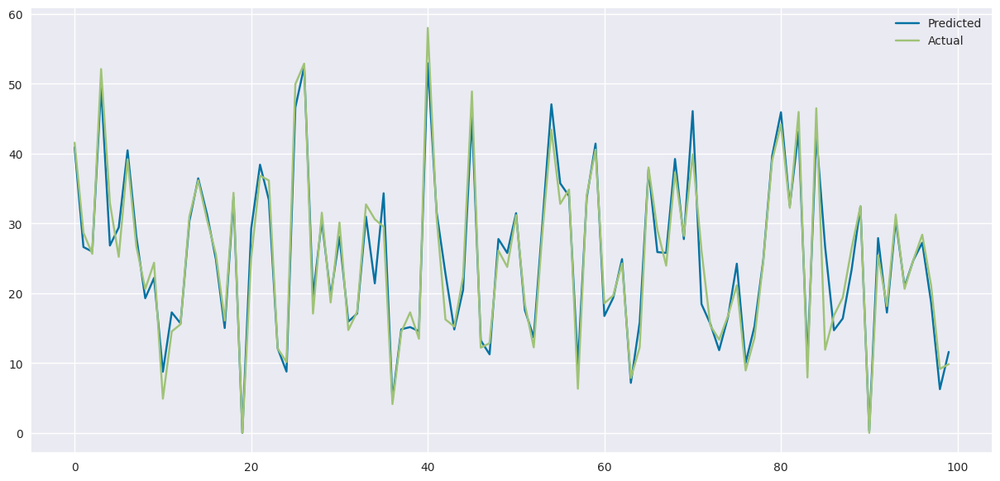

In [ ]:
get_linear_graph(y_pred_test_Rf , y_test )

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [ ]:
# Calculate MSE, MAE, R2 for training data:
MSEdt = mean_squared_error((y_train), (y_pred_train_Rf))
MAEdt = mean_absolute_error(y_train, y_pred_train_Rf)
r2dt = r2_score(y_train, y_pred_train_Rf)

In [ ]:
# Calculate MSE, MAE, R2 for testing data:
MSEtestdt = mean_squared_error((y_test), (y_pred_test_Rf))
MAEtestdt = mean_absolute_error(y_test, y_pred_test_Rf)
r2testdt = r2_score(y_test, y_pred_test_Rf)

In [ ]:
# Printing Errors:
print('Training Errors\nMSE:', MSEdt , '\nMAE:' , MAEdt , '\nR2:',round((r2dt),3))
print('\n\nTesting Errors\nMSE:', MSEtestdt , '\nMAE:' , MAEtestdt , '\nR2:',round((r2testdt),3))

Training Errors
MSE: 1.448380861541172 
MAE: 0.7762188779380931 
R2: 0.991


Testing Errors
MSE: 9.234639562514811 
MAE: 2.004242968164295 
R2: 0.94


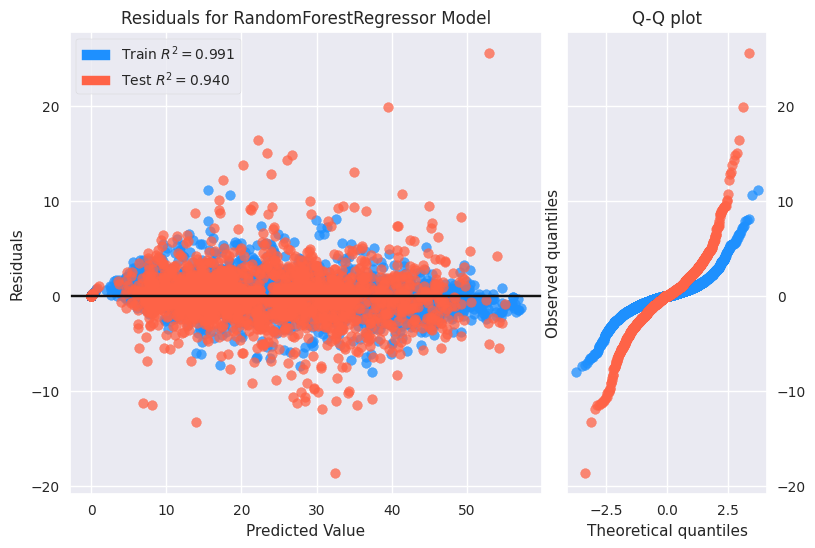

<Axes: title={'center': 'Residuals for RandomForestRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [ ]:
viz = ResidualsPlot(RandomForestRegressor(n_estimators=100, random_state=42),
                    train_color="dodgerblue",
                    test_color="tomato",
                    fig=plt.figure(figsize=(9,6)),
                    hist=False ,qqplot=True)

viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

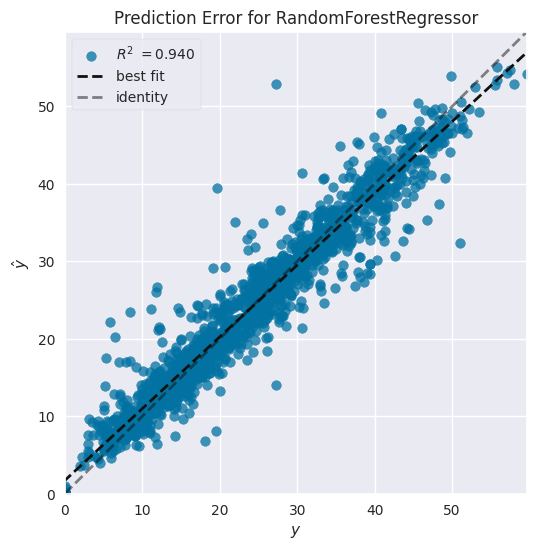

<Axes: title={'center': 'Prediction Error for RandomForestRegressor'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [ ]:
viz = PredictionError(RandomForestRegressor(n_estimators=100, random_state=42), train_color="dodgerblue",
                      test_color="tomato",
                      fig=plt.figure(figsize=(8,6)))
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

In [ ]:
# storing the train set metrics value in a dataframe for later comparison:

dict1={'Model':'RandomForestRegressor with GridSearchCv ',
       'MAE':round((MAEdt),3),
       'MSE':round((MSEdt),3),
       'R2_score':round((r2dt),3),
}
training_df=training_df.append(dict1,ignore_index=True)
# storing the test set metrics value in a dataframe for later comparison
dict2 = {'Model':'RandomForestRegressor with GridSearchCv ',
       'MAE':round((MAEtestdt),3),
       'MSE':round((MSEtestdt),3),
       'R2_score':round((r2testdt),3),
}
test_df=test_df.append(dict2,ignore_index=True)

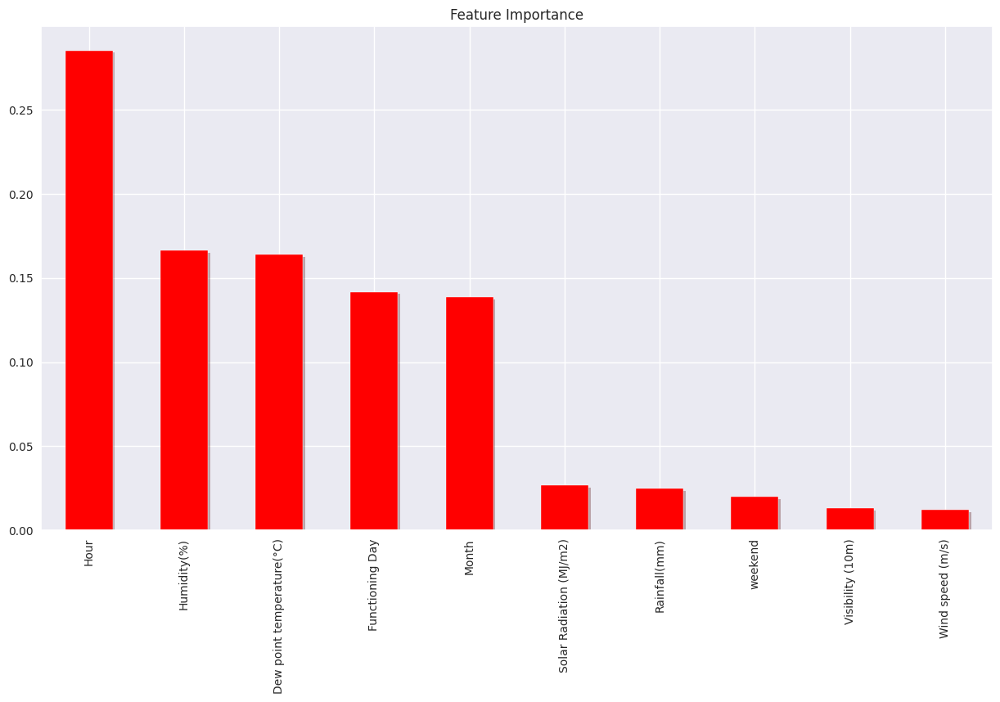

In [ ]:
get_feat_imp(Rf)

#### 2. Cross- Validation & Hyperparameter Tuning - Random Forest

In [ ]:
Random_forest = RandomForestRegressor()
parameters = {'n_estimators' : [int(x) for x in np.linspace(start=10,stop=20, num=5)], 
             'max_depth' : [10,15,20],
             'min_samples_split':[2,4],
             'min_samples_leaf':[1,2],
             'bootstrap' : [True,False]
             }

rf_model_grid = GridSearchCV(Random_forest,parameters,scoring='r2',cv=5)
rf_model_grid.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'bootstrap': [True, False], 'max_depth': [10, 15, 20],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 4],
                         'n_estimators': [10, 12, 15, 17, 20]},
             scoring='r2')

In [ ]:
# Getting the y_train and y-test value:
y_pred_train_Rf = rf_model_grid.predict(X_train)
y_pred_test_Rf = rf_model_grid.predict(X_test)

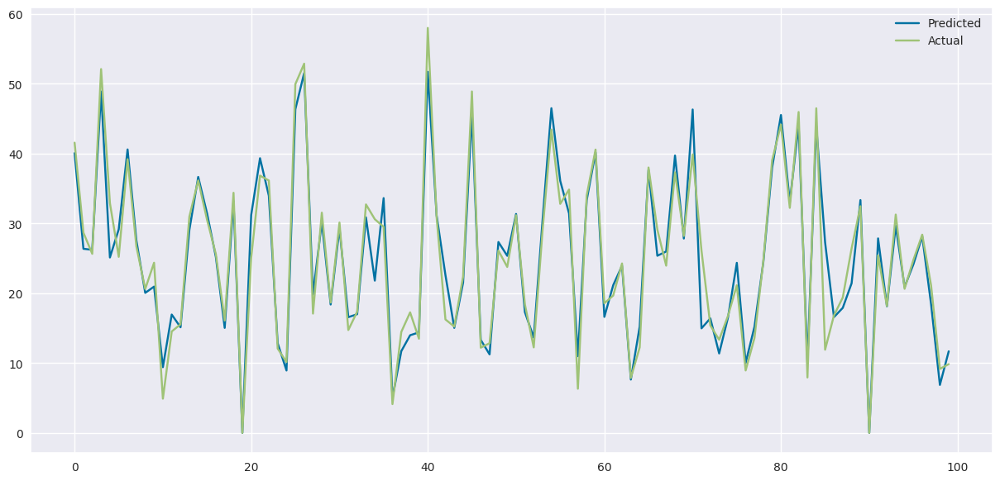

In [ ]:
get_linear_graph(y_pred_test_Rf , y_test )

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [ ]:
# Calculate MSE, MAE, R2 for training data:
MSEdt = mean_squared_error((y_train), (y_pred_train_Rf))
MAEdt = mean_absolute_error(y_train, y_pred_train_Rf)
r2dt = r2_score(y_train, y_pred_train_Rf)

In [ ]:
# Calculate MSE, MAE, R2 for testing data:
MSEtestdt = mean_squared_error((y_test), (y_pred_test_Rf))
MAEtestdt = mean_absolute_error(y_test, y_pred_test_Rf)
r2testdt = r2_score(y_test, y_pred_test_Rf)

In [ ]:
# Printing Errors:
print('Training Errors\nMSE:', MSEdt , '\nMAE:' , MAEdt , '\nR2:',round((r2dt),3))
print('\n\nTesting Errors\nMSE:', MSEtestdt , '\nMAE:' , MAEtestdt , '\nR2:',round((r2testdt),3))

Training Errors
MSE: 2.991112742194839 
MAE: 1.0870380452718418 
R2: 0.981


Testing Errors
MSE: 10.10964214479411 
MAE: 2.1163303475604174 
R2: 0.934


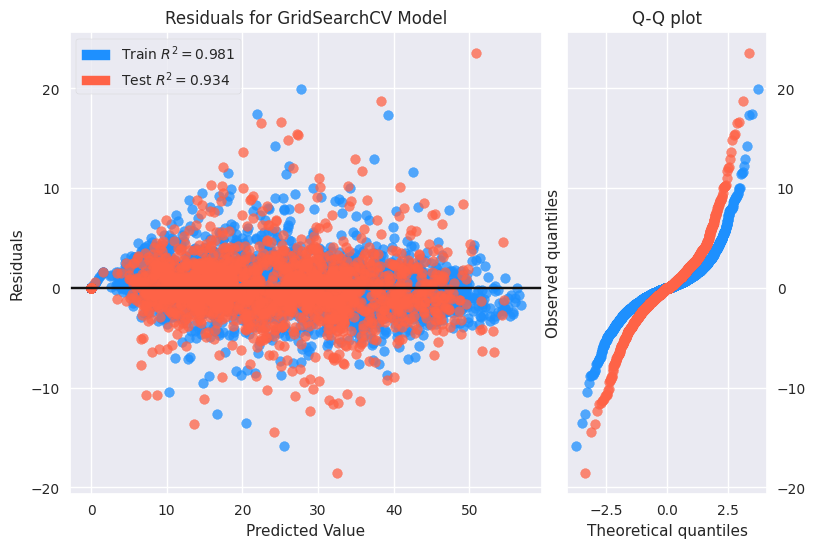

<Axes: title={'center': 'Residuals for GridSearchCV Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [ ]:
viz = ResidualsPlot(rf_model_grid,
                    train_color="dodgerblue",
                    test_color="tomato",
                    fig=plt.figure(figsize=(9,6)), hist=False ,qqplot=True)

viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

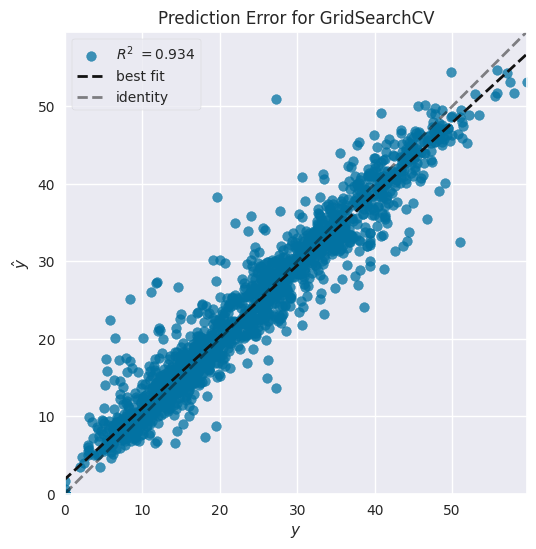

<Axes: title={'center': 'Prediction Error for GridSearchCV'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [ ]:
viz = PredictionError(rf_model_grid, train_color="dodgerblue",
                      test_color="tomato",
                      fig=plt.figure(figsize=(8,6)))
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

In [ ]:
# storing the train set metrics value in a dataframe for later comparison:

dict1={'Model':'RandomForestRegressor ',
       'MAE':round((MAEdt),3),
       'MSE':round((MSEdt),3),
       'R2_score':round((r2dt),3),
}
training_df=training_df.append(dict1,ignore_index=True)
# storing the test set metrics value in a dataframe for later comparison
dict2 = {'Model':'RandomForestRegressor ',
       'MAE':round((MAEtestdt),3),
       'MSE':round((MSEtestdt),3),
       'R2_score':round((r2testdt),3),
}
test_df=test_df.append(dict2,ignore_index=True)

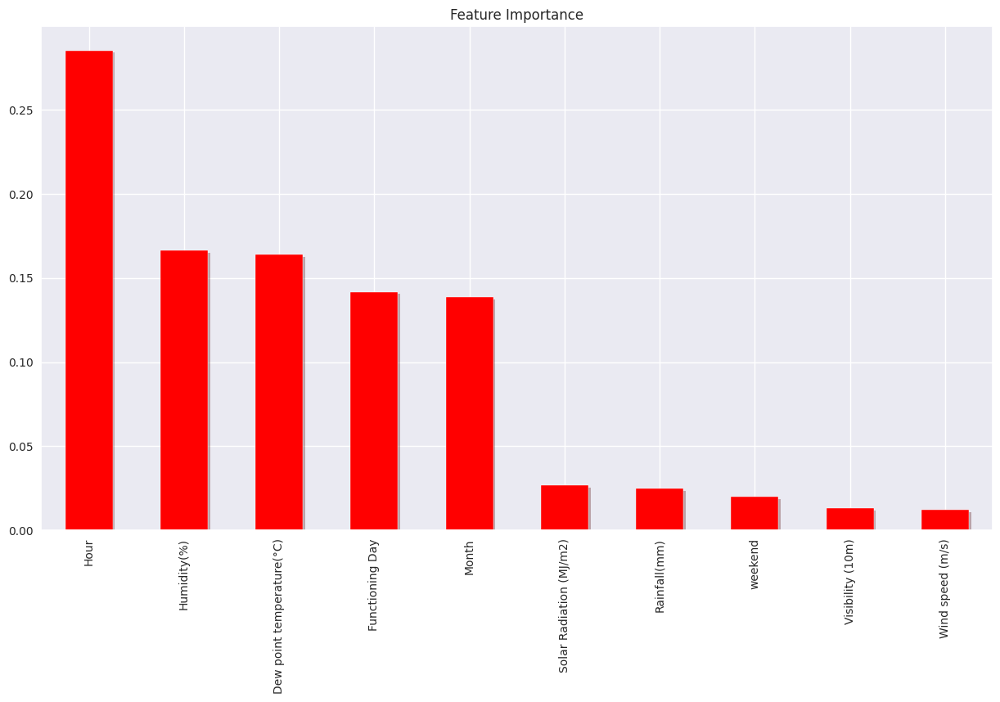

In [ ]:
get_feat_imp(Rf)

#### 2. Cross- Validation & Hyperparameter Tuning - GradientBoostingRegressor

In [ ]:
# ML Model - 3 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV
param_dict = {'n_estimators' : [50,80,100],
              'max_depth' : [4,6,8,10],
              'min_samples_split' : [50,80,100],
              'min_samples_leaf' : [40,50]}
gb = GradientBoostingRegressor()
# Grid search
gb_grid = GridSearchCV(estimator=gb,
                       param_grid = param_dict,
                       cv = 5, verbose=0)
gb_grid.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(),
             param_grid={'max_depth': [4, 6, 8, 10],
                         'min_samples_leaf': [40, 50],
                         'min_samples_split': [50, 80, 100],
                         'n_estimators': [50, 80, 100]})

In [ ]:
# Putting Best possible paramteres into model:
gb_optimal_model = gb_grid.best_estimator_

In [ ]:
# Making predictions on train and test data:
y_pred_traingbg = gb_optimal_model.predict(X_train)
y_predgbg= gb_optimal_model.predict(X_test)

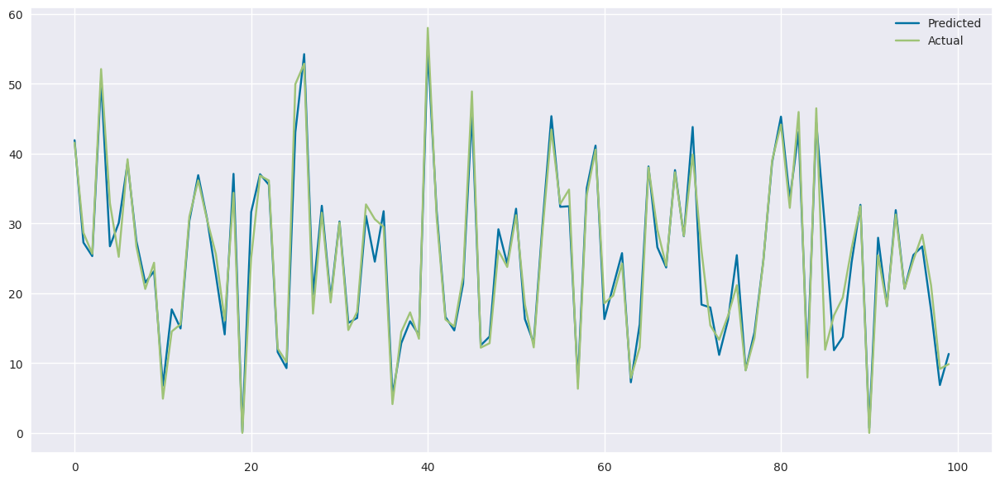

In [ ]:
get_linear_graph(y_predgbg , y_test)

In [ ]:
# Calculate MSE, MAE, R2 for training data :
MSEGBG = mean_squared_error((y_train), (y_pred_traingbg))
MAEGBG = mean_absolute_error(y_train, y_pred_traingbg)
r2GBG = r2_score(y_train, y_pred_traingbg)

In [ ]:
# Calculate MSE, MAE, R2 for testing data :
MSEtestGBG = mean_squared_error((y_test), (y_predgbg))
MAEtestGBG = mean_absolute_error(y_test, y_predgbg)
r2testGBG = r2_score(y_test, y_predgbg)

In [ ]:
# Printing Errors :
print('Training Errors\nMSE:', MSEGBG , '\nMAE:' , MAEGBG , '\nR2:',round((r2GBG),2))
print('\n\nTesting Errors\nMSE:', MSEtestGBG , '\nMAE:' , MAEtestGBG , '\nR2:',round((r2testGBG),2))

Training Errors
MSE: 5.16900018540814 
MAE: 1.5150830048019566 
R2: 0.97


Testing Errors
MSE: 8.743550242298333 
MAE: 1.9152072321792233 
R2: 0.94


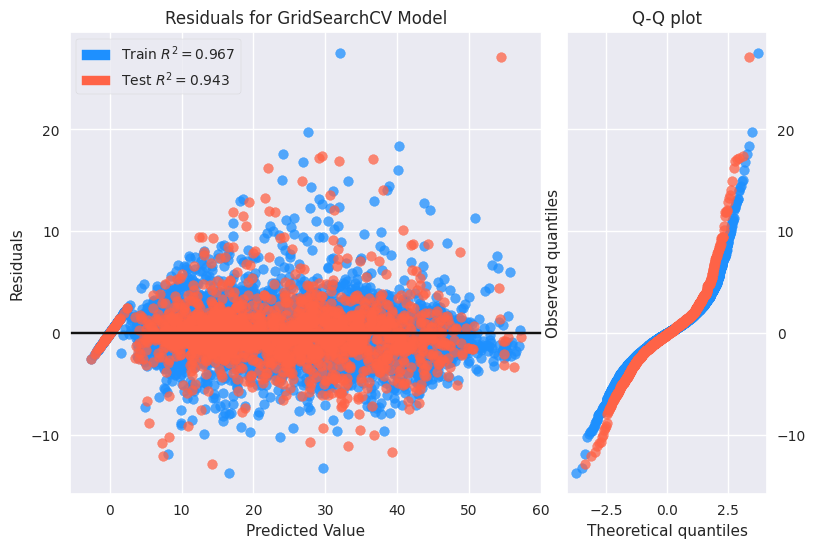

<Axes: title={'center': 'Residuals for GridSearchCV Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [ ]:
viz = ResidualsPlot(gb_grid,
                    train_color="dodgerblue",
                    test_color="tomato",
                    fig=plt.figure(figsize=(9,6)),hist=False ,qqplot=True)

viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

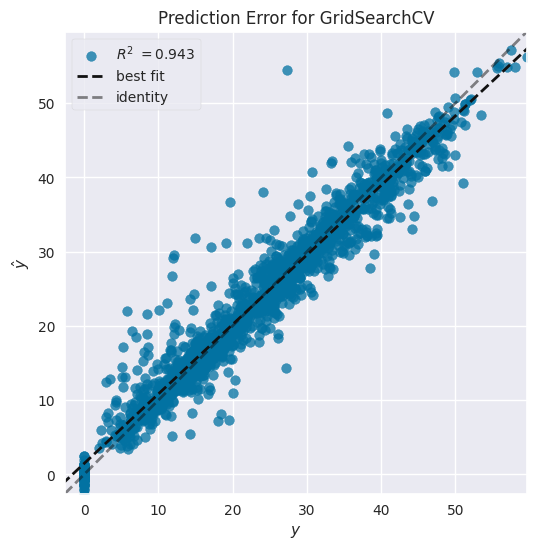

<Axes: title={'center': 'Prediction Error for GridSearchCV'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [ ]:
viz = PredictionError(gb_grid,
                      fig=plt.figure(figsize=(6,6))
                      )

viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

In [ ]:
# storing the train set metrics value in a dataframe for later comparison:
dict1={'Model':'Gradient Boost with GridSearch ',
       'MAE':round((MAEGBG),3),
       'MSE':round((MSEGBG),3),
       'R2_score':round((r2GBG),3)}
       
training_df=training_df.append(dict1,ignore_index=True)

In [ ]:
# storing the train set metrics value in a dataframe for later comparison:

dict2={'Model':'Gradient Boost with GridSearch ',
       'MAE':round((MAEtestGBG),3),
       'MSE':round((MSEtestGBG),3),
       'R2_score':round((r2testGBG),3)}
      
test_df=test_df.append(dict2,ignore_index=True) 

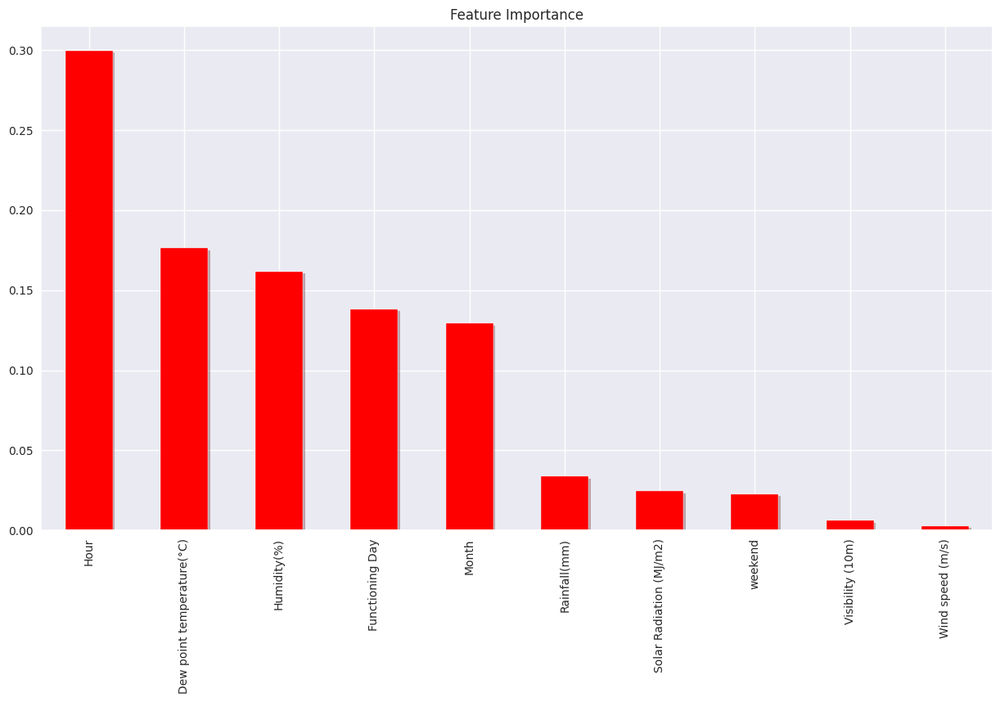

In [ ]:
get_feat_imp(gb_optimal_model)

#  Hyper paramter tuning for eXtremeGradientBoosting





In [ ]:
param_grid = {'n_estimators': [300,500],     # number of trees in the ensemble
             'max_depth': [7,8],             # maximum number of levels allowed in each tree.
             'min_samples_split': [3,5],     # minimum number of samples necessary in a node to cause node splitting.
             'min_samples_leaf': [3,5]}      # minimum number of samples which can be stored in a tree leaf.


# Initialize the RandomForestRegressor model
xgb = XGBRegressor()

# Use GridSearchCV to perform a grid search over the parameter grid
grid_search = GridSearchCV(xgb, param_grid=param_grid, cv=5, scoring='r2')

# Fit the model to the training data
grid_search.fit(X_train,y_train)

[10:56:00] WARNING: ../src/learner.cc:767: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

[10:56:01] WARNING: ../src/learner.cc:767: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

[10:56:02] WARNING: ../src/learner.cc:767: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

[10:56:04] WARNING: ../src/learner.cc:767: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

[10:56:05] WARNING: ../src/learner.cc:767: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

[10:56:08] WARNING: ../src/learner.cc:767: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

[10:56:10] WARNING: ../src/learner.cc:767: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

[10:56:13] WARNING: ../src/learner.cc:767: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

[10:56:15] WARNING: ../src/learner.cc:767: 
Parameters: { "min_samples_leaf", "m

GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None, gpu_id=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, m...
                                    max_cat_threshold=None,
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None, n_estimators=100,
                                    n_jobs=None, num_parallel_tree=None,
                                    predictor=None, random_state=None, ...),
             param_grid={'max_depth': [7, 8], 'min_samples_leaf': [3, 5],
                         'min_samples_split': [3, 5],
                         'n_estimators': [300, 500]},
             scoring='r2')

In [ ]:
# Putting Best possible paramteres into model:
gb_optimal_modelXGB = grid_search.best_estimator_

In [ ]:
# Making predictions on train and test data:
y_pred_traingexgb = gb_optimal_modelXGB.predict(X_train)
y_predexgb= gb_optimal_modelXGB.predict(X_test)

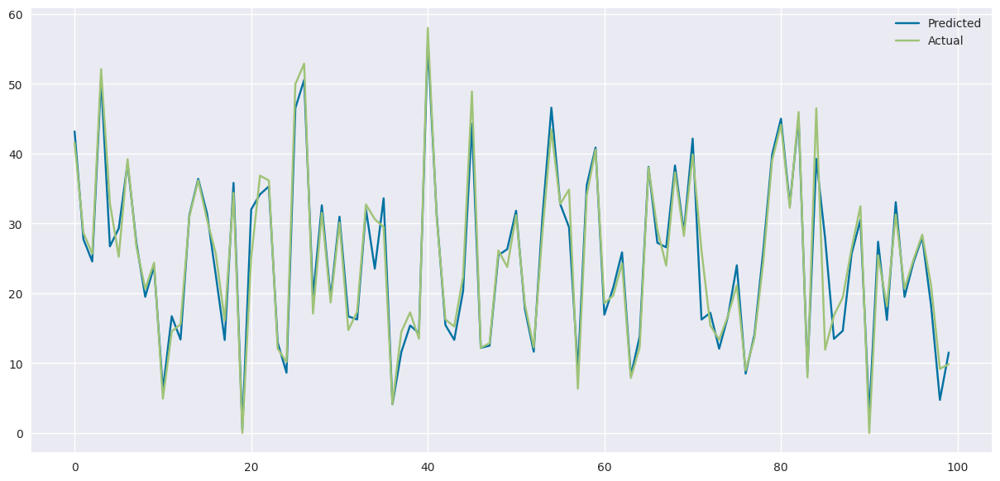

In [ ]:
get_linear_graph(y_predexgb , y_test )

In [ ]:
# Calculate MSE, MAE, R2 for training data :
MSEGBG = mean_squared_error((y_train), (y_pred_traingexgb))
MAEGBG = mean_absolute_error(y_train, y_pred_traingexgb)
r2GBG = r2_score(y_train, y_pred_traingexgb)

In [ ]:
# Calculate MSE, MAE, R2 for testing data :
MSEtestGBG = mean_squared_error((y_test), (y_predexgb))
MAEtestGBG = mean_absolute_error(y_test, y_predexgb)
r2testGBG = r2_score(y_test, y_predexgb)

In [ ]:
# Printing Errors :
print('Training Errors\nMSE:', MSEGBG , '\nMAE:' , MAEGBG , '\nR2:',round((r2GBG),2))
print('\n\nTesting Errors\nMSE:', MSEtestGBG , '\nMAE:' , MAEtestGBG , '\nR2:',round((r2testGBG),2))

Training Errors
MSE: 0.0002999299855169969 
MAE: 0.01046634397662894 
R2: 1.0


Testing Errors
MSE: 8.433995427010196 
MAE: 1.8541097935505224 
R2: 0.95


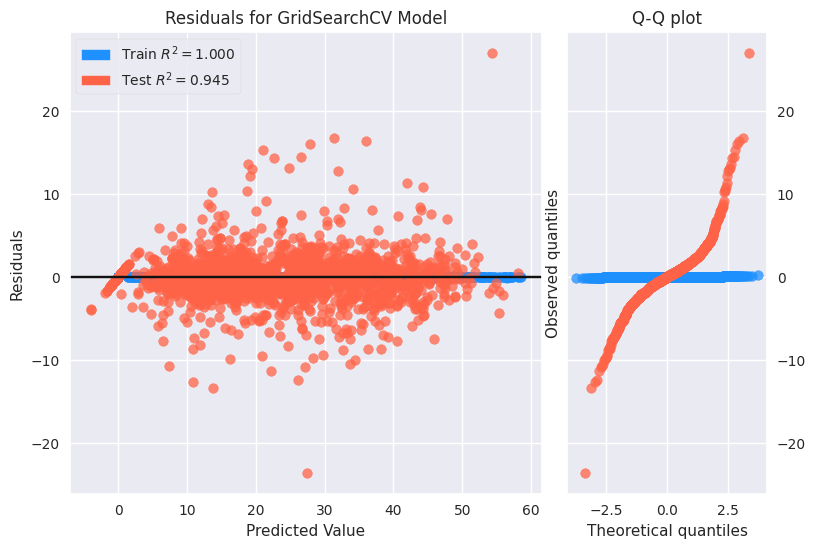

<Axes: title={'center': 'Residuals for GridSearchCV Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [ ]:
viz = ResidualsPlot(grid_search,
                    train_color="dodgerblue",
                    test_color="tomato",
                    fig=plt.figure(figsize=(9,6)),hist=False ,qqplot=True)

viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

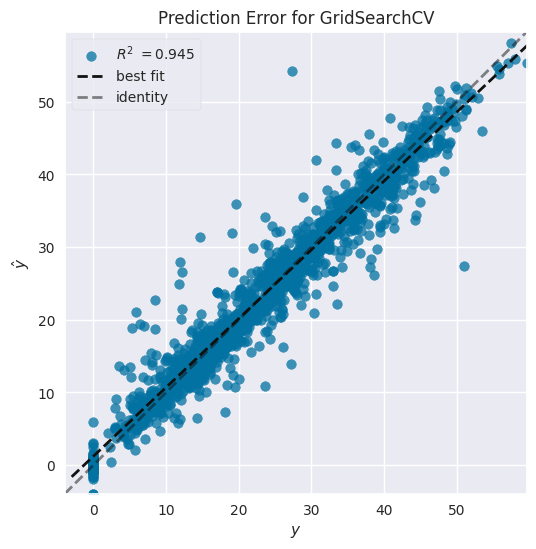

<Axes: title={'center': 'Prediction Error for GridSearchCV'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [ ]:
viz = PredictionError(grid_search,
                      fig=plt.figure(figsize=(6,6))
                      )

viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

In [ ]:
# storing the train set metrics value in a dataframe for later comparison:
dict1={'Model':' XGBoost with GridSearch ',
       'MAE':round((MAEGBG),3),
       'MSE':round((MSEGBG),3),
       'R2_score':round((r2GBG),3)}
       
training_df=training_df.append(dict1,ignore_index=True)

In [ ]:
# storing the train set metrics value in a dataframe for later comparison:

dict2={'Model':'XGBoost with GridSearch ',
       'MAE':round((MAEtestGBG),3),
       'MSE':round((MSEtestGBG),3),
       'R2_score':round((r2testGBG),3)}
      
test_df=test_df.append(dict2,ignore_index=True) 

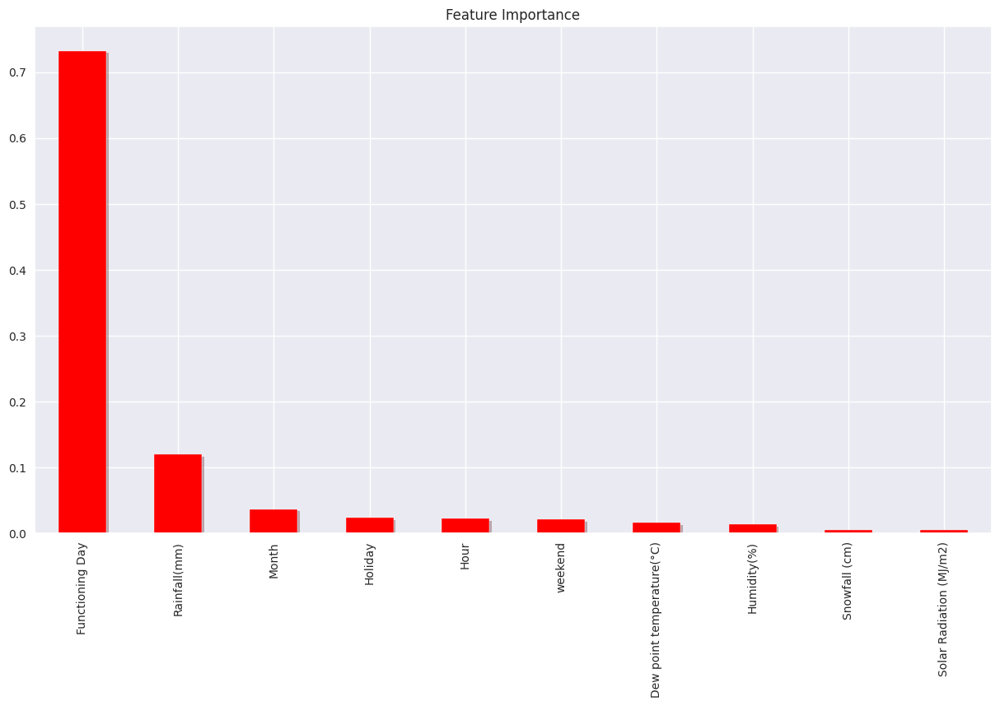

In [ ]:
get_feat_imp(gb_optimal_modelXGB)

# Hyperparameter tuning of LightGBM

In [ ]:
param_grid = {'n_estimators': [600,800],     # number of trees in the ensemble
             'max_depth': [8,10],            # maximum number of levels allowed in each tree.
             'min_samples_split': [3,5],     # minimum number of samples necessary in a node to cause node splitting.
             'min_samples_leaf': [2,3]}      # minimum number of samples which can be stored in a tree leaf.


# Initialize the RandomForestRegressor model
lgb = LGBMRegressor()

# Use GridSearchCV to perform a grid search over the parameter grid
grid_search = GridSearchCV(lgb, param_grid=param_grid, cv=5, scoring='r2')

# Fit the model to the training data
grid_search.fit(X_train,y_train)

[LightGBM] [Warning] min_data_in_leaf is set with min_samples_leaf=2, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_samples_leaf=2, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_samples_leaf=2, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_samples_leaf=2, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_samples_leaf=2, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2
[LightGBM] [Warning] Unknown parameter: min_samples_split


GridSearchCV(cv=5, estimator=LGBMRegressor(),
             param_grid={'max_depth': [8, 10], 'min_samples_leaf': [2, 3],
                         'min_samples_split': [3, 5],
                         'n_estimators': [600, 800]},
             scoring='r2')

In [ ]:
# Putting Best possible paramteres into model:
gb_optimal_modelLGB = grid_search.best_estimator_

In [ ]:
# Making predictions on train and test data:
y_pred_traingLGB = gb_optimal_modelLGB.predict(X_train)
y_predLGB= gb_optimal_modelLGB.predict(X_test)

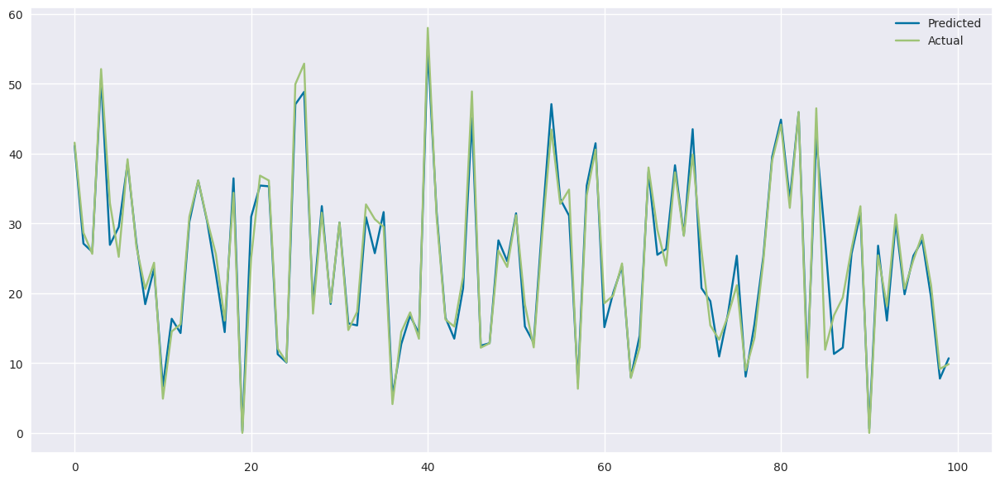

In [ ]:
get_linear_graph(y_predLGB , y_test)

In [ ]:
# Calculate MSE, MAE, R2 for training data :
MSEGBG = mean_squared_error((y_train), (y_pred_traingLGB))
MAEGBG = mean_absolute_error(y_train, y_pred_traingLGB)
r2GBG = r2_score(y_train, y_pred_traingLGB)

In [ ]:
# Calculate MSE, MAE, R2 for testing data :
MSEtestGBG = mean_squared_error((y_test), (y_predLGB))
MAEtestGBG = mean_absolute_error(y_test, y_predLGB)
r2testGBG = r2_score(y_test, y_predLGB)

In [ ]:
# Printing Errors :
print('Training Errors\nMSE:', MSEGBG , '\nMAE:' , MAEGBG , '\nR2:',round((r2GBG),2))
print('\n\nTesting Errors\nMSE:', MSEtestGBG , '\nMAE:' , MAEtestGBG , '\nR2:',round((r2testGBG),2))

Training Errors
MSE: 0.4336858253532852 
MAE: 0.47573529285976734 
R2: 1.0


Testing Errors
MSE: 7.435847014432432 
MAE: 1.7224650824430314 
R2: 0.95


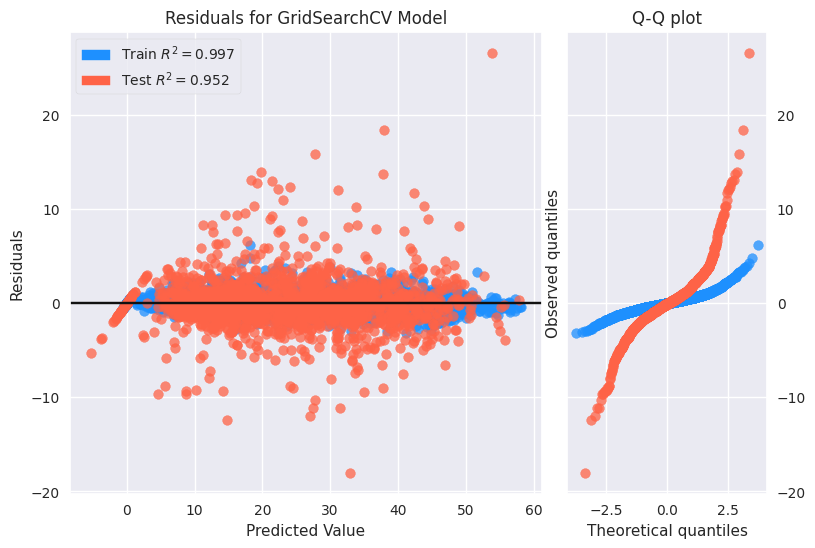

<Axes: title={'center': 'Residuals for GridSearchCV Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [ ]:
viz = ResidualsPlot(grid_search,
                    train_color="dodgerblue",
                    test_color="tomato",
                    fig=plt.figure(figsize=(9,6)),hist=False ,qqplot=True)

viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

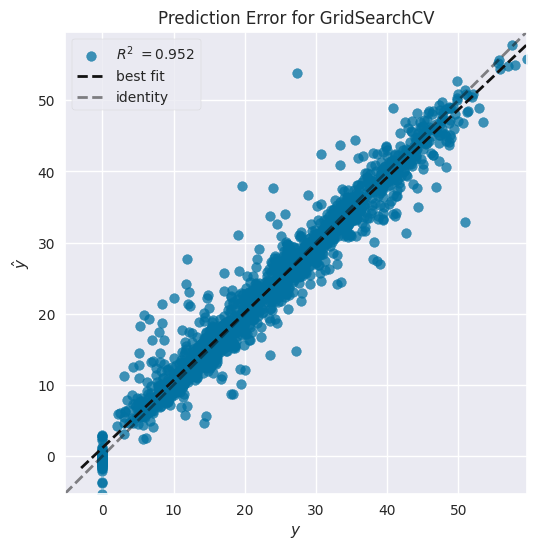

<Axes: title={'center': 'Prediction Error for GridSearchCV'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [ ]:
viz = PredictionError(grid_search,
                      fig=plt.figure(figsize=(6,6))
                      )

viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

In [ ]:
# storing the train set metrics value in a dataframe for later comparison:
dict1={'Model':' LightGBM with GridSearch ',
       'MAE':round((MAEGBG),3),
       'MSE':round((MSEGBG),3),
       'R2_score':round((r2GBG),3)}
       
training_df=training_df.append(dict1,ignore_index=True)

In [ ]:
# storing the train set metrics value in a dataframe for later comparison:

dict2={'Model':'LightGBM with GridSearch ',
       'MAE':round((MAEtestGBG),3),
       'MSE':round((MSEtestGBG),3),
       'R2_score':round((r2testGBG),3)}
      
test_df=test_df.append(dict2,ignore_index=True) 

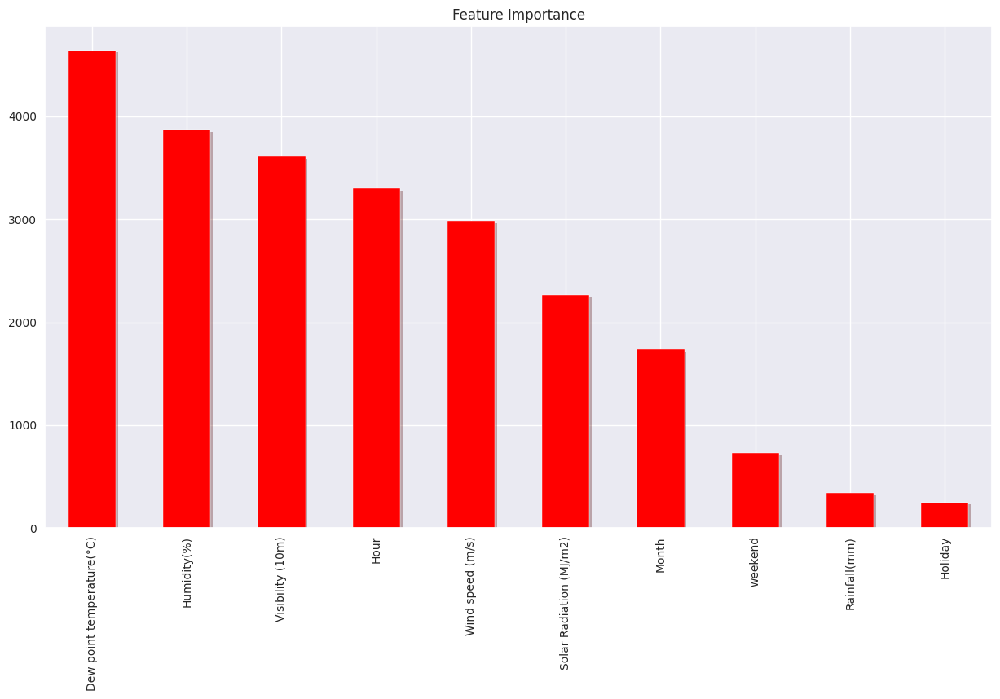

In [ ]:
get_feat_imp(gb_optimal_modelLGB)

##### Which hyperparameter optimization technique have you used and why?

Here we have used GridSearchCV as we known it is a technique for finding the optimal parameter values from a given set of parameters in a grid. It's essentially a cross-validation technique. The model as well as the parameters must be entered. After extracting the best parameter values, predictions are made.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Yes we have noted significant improvement.

In [ ]:
# Combining Train and Test erros in a single dataframe:
matrix = pd.concat([training_df,test_df],keys=['Training set','Test set'], axis =1)

In [ ]:
matrix

Training set                          \
                                      Model    MAE     MSE R2_score   
0                        Linear regression   5.672  52.635    0.661   
1                    Polynomial regression   4.557  36.059    0.768   
2                 Decision Tree Regression   3.137  19.202    0.876   
3  RandomForestRegressor with GridSearchCv   0.776   1.448    0.991   
4                    RandomForestRegressor   1.087   2.991    0.981   
5           Gradient Boost with GridSearch   1.515   5.169    0.967   
6                  XGBoost with GridSearch   0.010   0.000    1.000   
7                 LightGBM with GridSearch   0.476   0.434    0.997   

                                   Test set                          
                                      Model    MAE     MSE R2_score  
0                        Linear regression   5.709  53.975    0.649  
1                    Polynomial regression   4.706  39.054    0.746  
2                 Decision Tree Regression   3.371  22.783    0.852  
3  RandomForestRegressor with GridSearchCv   2.004   9.235    0.940  
4                    RandomForestRegressor   2.116  10.110    0.934  
5           Gradient Boost with GridSearch   1.915   8.744    0.943  
6                  XGBoost with GridSearch   1.854   8.434    0.945  
7                 LightGBM with GridSearch   1.722   7.436    0.952

In [ ]:
temp= test_df[['Model','R2_score']]
temp= temp.sort_values(by='R2_score', ascending=True)

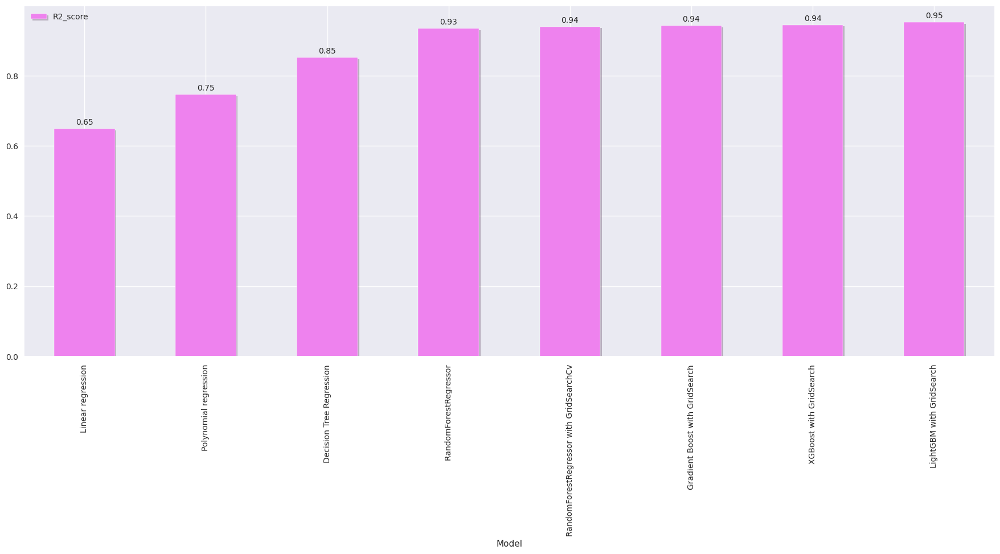

In [ ]:
ax=temp.plot(x="Model", y=["R2_score"],color ='violet' ,kind="bar", figsize=(22, 8),path_effects=[path_effects.SimplePatchShadow(),path_effects.Normal()])
for bar in ax.patches:
    ax.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=10, xytext=(0, 8),
                   textcoords='offset points')

### 2. Which ML model did you choose from the above created models as your final prediction model and why?


The Best performimg model is LightGBM with Gridsearch  so we use this for final prediction.


### 3. Explain the model which you have used and the feature importance using any model explainability tool?

Here we are using eli5 and shap as the model explainability tool. As we know SHAP (SHapley Additive exPlanations) is a method to explain individual predictions. SHAP is based on the game theoretically optimal Shapley values. The feature values of a data instance act as players in a coalition. Shapley values tell us how to fairly distribute the prediction among the features.

In [ ]:
#creating function for getting shape of JS visualization using shap in notebook environment
def get_shap(model):
  sns.set_style('darkgrid')
  for_instance=2
  shap.initjs()                                                                                                            #to get JS visualisation
  explainer = shap.TreeExplainer(model)
  shap_values = explainer(X_test,check_additivity=False)                                                                   #using explainer.shap_values to get shap values of each feature
  return shap.plots.force(shap_values[for_instance],feature_names=X.columns)                                               #getting the names of feature and plotting the same using feature_names from X's features as X.columns

In [ ]:
#creatung function to get shap summary
def get_shap_summary(model):
  model.fit(X_test,y_test)
  explainer = shap.TreeExplainer(model)
  shap_values=explainer.shap_values(X_test,check_additivity=False)                                                         #using explainer.shap_values to get shap values of each feature
  return shap.summary_plot(shap_values, X_test,feature_names=X.columns)                                                    #getting the names of feature and plotting the same using feature_names from X's features as X.columns

In [ ]:
#creatung function to get shap summary
def get_shap_summary2(model):
  model.fit(X_test,y_test)
  explainer = shap.TreeExplainer(model)
  shap_values=explainer.shap_values(X_test,check_additivity=False)                                                         #using explainer.shap_values to get shap values of each feature
  return shap.summary_plot(shap_values, X_test, plot_type="bar",feature_names=X.columns)                                   #getting the names of feature and plotting the same

In [ ]:
def get_shap_summary3(model):
  model.fit(X_test,y_test)
  explainer = shap.TreeExplainer(model)
  shap_values=explainer.shap_values(X_test,check_additivity=False)                                                         #using explainer.shap_values to get shap values of each feature
  return shap.summary_plot(shap_values, X_test, link="identity",feature_names=X.columns) 

In [ ]:
#calling function to get shap JS visualization:
get_shap(gb_optimal_modelLGB)

[LightGBM] [Warning] min_data_in_leaf is set with min_samples_leaf=3, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3
[LightGBM] [Warning] Unknown parameter: min_samples_split


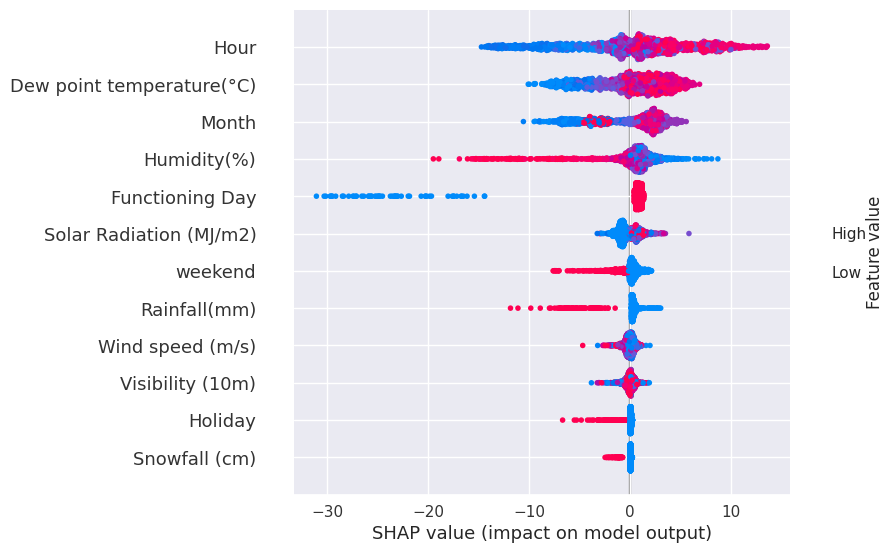

[LightGBM] [Warning] min_data_in_leaf is set with min_samples_leaf=3, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3
[LightGBM] [Warning] Unknown parameter: min_samples_split


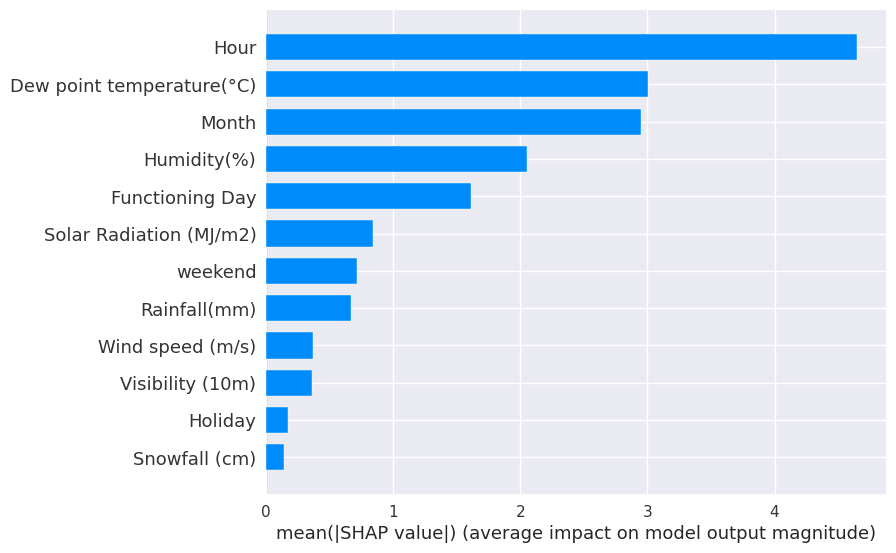

In [ ]:
#calling functions to get shap summary
get_shap_summary(gb_optimal_modelLGB)
get_shap_summary2(gb_optimal_modelLGB)

In [ ]:
! pip install eli5

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
feature_names=list(X_test.columns)

In [ ]:
for_instance=3

In [ ]:
#eli5 for xgboost model
import eli5 
eli5.show_prediction(gb_optimal_modelLGB, X_test.reset_index(drop=True).loc[[for_instance]],
                    feature_names=feature_names,
                    show_feature_values=True)

## ***8.*** ***Future Work (Optional)***

### 1. Save the best performing ml model in a pickle file or joblib file format for deployment process.


In [ ]:
# Save the File

### 2. Again Load the saved model file and try to predict unseen data for a sanity check.


In [ ]:
# Load the File and predict unseen data.

### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**

**Things that we concluded from our EDA**.

1. **Bikes are rented more when there is considerably low rainfall** at 1.3mm bike counted was 764 can say no rainfall... and count on that too is 739
and  is around 12mm to 16mm between 11 to 1.  

---


2. Bikes are mostly renetd at 32* which is bascially a normal temeprature and has the highest no.. around 1692.. while the lowest at -15 around 25.  

---


3. **Highest number of bikes were rented during Summer seasons** it was 1034 while least number of bikes were rented during *Winter seasons*. it was 225 and almost evenly in spring and autumn ranging from 730 to 8194.  

---


4. Large no. of bikes are rented when there are **non holiday** it was 715 and very less no. is for holiday which was 499.  

---


5. Bikes are only rented only on functional day. with the count of 729.  

---


6. Bikes rented on saturday was more it was around 719 while it was low on sundays around 667.  

---


7. **Maximum no. of bike rented is in the evening at 6 pm** which was 1502 and the least was in the morining at 4 am around 132. The above graph shows that bike should be more available in the evening as compared to morning.  

---


8. Customers have rented bikes more on friday following as considering weekends the count for friday was around 747 and it was some what same in the wednesday and monday to around 740 and 730 but the least no. of bike rented was on the Sunday 625..  

---


9. we can see that our bikes rented count went on increasing for the month is january from 201. it was in the **peek in the month of june**  which was 1245 and then it saw a sudden downfall around 249 counts in december.    

---



Bikes should be more avaliable while there is less rainfall, bike should be more available in the range of 15* to  32* which is normal temperature so bikes should be more avaliable at that temperature ranges. Bikes should be available more on non holidays as compared to those on holiday. People prefer bikes more in the months of summer and almost equally in the spring and autumn and least in  winter,.. so bikes should be more available in summer season and accordingly in the following season. Bikes should be available almost on functional day and being on the safer end few counts for non functional day, bikes are mostly evenly rented ranging form 600 to 750 which is desent count so accordinly bike should be availabe everyday and count should be around 800 .. as better option, no. of supply of bike should me more in the month of june and gradually follows.

**Challenges that we faced**;  

Removing outlier.  
Checking multicollinearity.  
Feature selection.  
Hypothesis testing.  
Feature Selection

-We created a new feature weekend.


-We Have used splitting ratio of **80:20** as it is consider to be the best ratio for model training i.e 80% for trainig and 20% for testing

-The Best performimg model is **LightGBM with Gridsearch** after doing Grid search  so we use this for final prediction.  

-We Used shap as the explainability tool for **LightGBM with Gridsearch** model.

-The most important feature in the data comes out to be is **Hour**,.  

---



---



**Over all we can conclude that Bike count should be more on the peak hours which is evening hours**.  


### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***